In [1]:
import sys
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import numpy as np

from mpc_simulations import MPC_simulations

# Construct model and start renderer:
mpc = MPC_simulations()

mpc.Renderer()
mpc.ConstructModel()

# Scale model:
mdl_scale = [0.8,0.8,0.8,1.0,1.0]
#mdl_scale = [1.0,0.8,0.6,1.03,1.03]
mpc.ScaleModel(mdl_scale)

# Orient body model:
s_thorax  = np.array([np.cos((-35.0/180.0)*np.pi/2.0),0.0,np.sin((-35.0/180.0)*np.pi/2.0),0.0,0.0,0.0,0.0])
s_head 	  = np.array([np.cos((-5.0/180.0)*np.pi/2.0),0.0,np.sin((-5.0/180.0)*np.pi/2.0),0.0,0.55*mdl_scale[0],0.0,0.42*mdl_scale[0]])
s_abdomen = np.array([np.cos((-70.0/180.0)*np.pi/2.0),0.0,np.sin((-70.0/180.0)*np.pi/2.0),0.0,0.0,0.0,-0.1*mdl_scale[2]])
s_wing_L  = np.array([1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0])
s_wing_R  = np.array([1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0])
mpc.SetModelState(s_head,s_thorax,s_abdomen,s_wing_L,s_wing_R)

# Set Strokeplane Reference Frame angle:
mpc.set_srf_angle(np.pi*(45.0/180.0))

# Compute inertia parameters:
mpc.ComputeInertia()

# print parameters:
print('-----parameters-----')
print('body mass: '+str(mpc.body_mass)+' kg')
print('body cg:')
print(mpc.body_cg)
print('body inertia tensor:')
print(mpc.body_I)
print('wing mass: '+str(mpc.wing_L_m)+' kg')
print('wing length: '+str(mpc.R_fly)+' mm')
print('wing area: '+str(mpc.wing_S)+' mm^2')
print('wing Sxx: '+str(mpc.wing_S_xx)+' mm^4')
print('wing Syy: '+str(mpc.wing_S_yy)+' mm^4')
print('wing Sx|x|: '+str(mpc.wing_S_xx_asym)+' mm^4')
print('mean chord: '+str(mpc.c_mean)+' mm')
print('Left wing cg: ')
print(mpc.wing_L_cg)
print('Left wing inertia tensor:')
print(mpc.wing_L_I)
print('Left wing M:')
print(mpc.MwL)
print('Right wing cg: ')
print(mpc.wing_R_cg)
print('Right wing inertia tensor:')
print(mpc.wing_R_I)
print('Right wing M:')
print(mpc.MwR)

2023-09-15 15:12:59.331460: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-15 15:12:59.368529: I tensorflow/tsl/cuda/cudart_stub.cc:28] Could not find cuda drivers on your machine, GPU will not be used.
2023-09-15 15:12:59.369330: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-09-15 15:13:02.274647: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


-----parameters-----
body mass: 1.1616055296000005e-06 kg
body cg:
[ 0.   0.  -0.1]
body inertia tensor:
[[ 6.85991584e-07 -2.99717068e-11  1.84321315e-07]
 [-2.99717068e-11  7.83912913e-07 -2.19229251e-11]
 [ 1.84321315e-07 -2.19229251e-11  2.32819225e-07]]
wing mass: 1.6101504000000004e-09 kg
wing length: 2.6240999698638916 mm
wing area: 2.4847999999997916 mm^2
wing Sxx: 0.2933589701088522 mm^4
wing Syy: 5.319271508842891 mm^4
wing Sx|x|: -0.21991788949721017 mm^4
mean chord: 0.9469151436820735 mm
Left wing cg: 
[[-0.16073264]
 [ 1.30548175]
 [ 0.        ]]
Left wing inertia tensor:
[[6.32538823e-09 5.48106973e-10 0.00000000e+00]
 [5.48106973e-10 3.55583723e-10 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 6.68097195e-09]]
Left wing M:
[[ 1.61015040e-09  0.00000000e+00  0.00000000e+00  0.00000000e+00
   0.00000000e+00 -2.10202196e-09]
 [ 0.00000000e+00  1.61015040e-09  0.00000000e+00 -0.00000000e+00
   0.00000000e+00 -2.58803725e-10]
 [ 0.00000000e+00  0.00000000e+00  1.61015040e-0

#### Load muscle-to-wing-motion network

Here we load the Convolutional Neural Network that has been trained to predict wing motion based on the activity pattern of the 12 steering muscles. After building the network layout, we load each layer with the training coefficients.

In [2]:
print('loading network')
mpc.load_network()

loading network
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 9, 13, 1)]        0         
                                                                 
 model (Functional)          (None, 256)               213888    
                                                                 
 model_1 (Functional)        (None, 80)                345168    
                                                                 
Total params: 559,056
Trainable params: 559,056
Non-trainable params: 0
_________________________________________________________________
network weigths loaded


In [3]:
# Set wingbeat frequency (constant over maneuvers):
wb_f = 200.0
mpc.set_wingbeat_freq(wb_f)

# Initialize MPC controller
mpc.setup_MPC()

# MPC parameters:
N_robust = 9   # number of potential trajectories
N_horizon = 10  # number of wingbeats the controller is looking ahead
N_state = 13   # number of state parameters

mpc.set_N_robust(N_robust)
mpc.set_N_horizon(N_horizon)
mpc.set_N_state(N_state)

M
[[ 1.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  -1.00000000e-01 -0.00000000e+00]
 [ 0.00000000e+00  1.00000000e+00  0.00000000e+00  1.00000000e-01
   0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
  -0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00  1.00000000e-01  0.00000000e+00  5.90554682e-01
  -2.58019663e-05  1.58678063e-01]
 [-1.00000000e-01  0.00000000e+00 -0.00000000e+00 -2.58019663e-05
   6.74852945e-01 -1.88729517e-05]
 [-0.00000000e+00  0.00000000e+00  0.00000000e+00  1.58678063e-01
  -1.88729517e-05  2.00428819e-01]]

M inv
[[ 1.01504092e+00 -3.59066335e-07  0.00000000e+00  3.59066335e-06
   1.50409201e-01  1.13202587e-05]
 [-3.59066335e-07  1.02198138e+00  0.00000000e+00 -2.19813847e-01
  -3.59066335e-06  1.74025050e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00  0.00000000e+00
   0.00000000e+00  0.00000000e+00]
 [ 3.59066335e-06 -2.19813847e-01  0.00000000e+00  2.19813847e+00
   3.59066335e-

#### Create file directory for videos and plots

Here we create the necessary directories to save the videos and plots of various maneuvers.

In [4]:
print(mpc.working_dir)
mpc.create_plot_locations()

/home/wbd/work/projects/johan/mpc-simulations/notebook
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/hover_flight
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/forward
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/backward
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/sideward
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/downward
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/upward
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/forward_flight
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/saccade_left
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/saccade_right
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/loom_left
created:  /home/wbd/work/projects/johan/mpc-simulations/notebook/plots/loom_right
created:  /home/wbd/work/projects/johan/mpc-si

#### Find stable hovering flight configuration

In this experiment we find the precise body orientation, muscle activity and wing kinematics which can sustain stable hovering flight. The control problem is fairly simple, we specify that the fly must be at the starting position with zero body (angular) velocity after 20 wingbeats. During this simulation, the MPC controller will find the body state vector and muscle activities that support stable hovering flight.


******************************************************************************
This program contains Ipopt, a library for large-scale nonlinear optimization.
 Ipopt is released as open source code under the Eclipse Public License (EPL).
         For more information visit https://github.com/coin-or/Ipopt
******************************************************************************

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6208

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality c

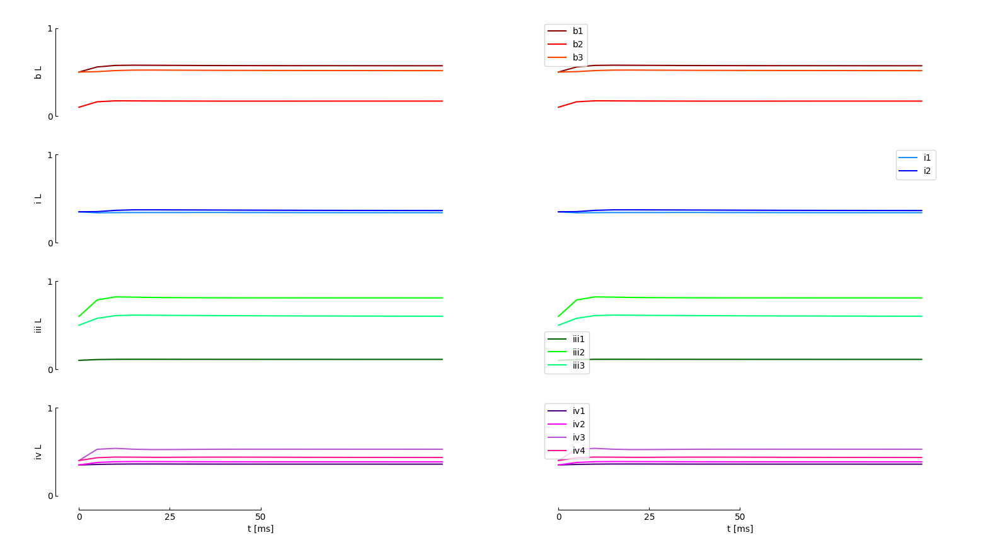

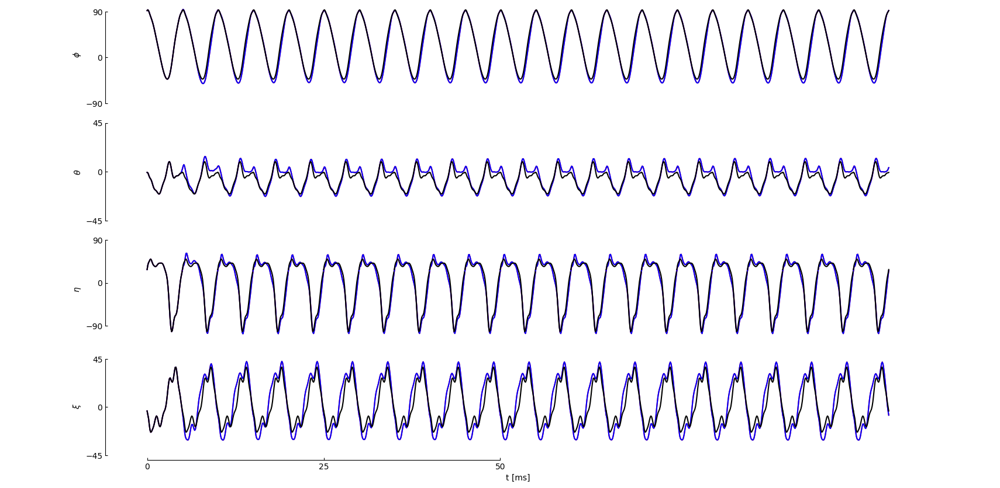

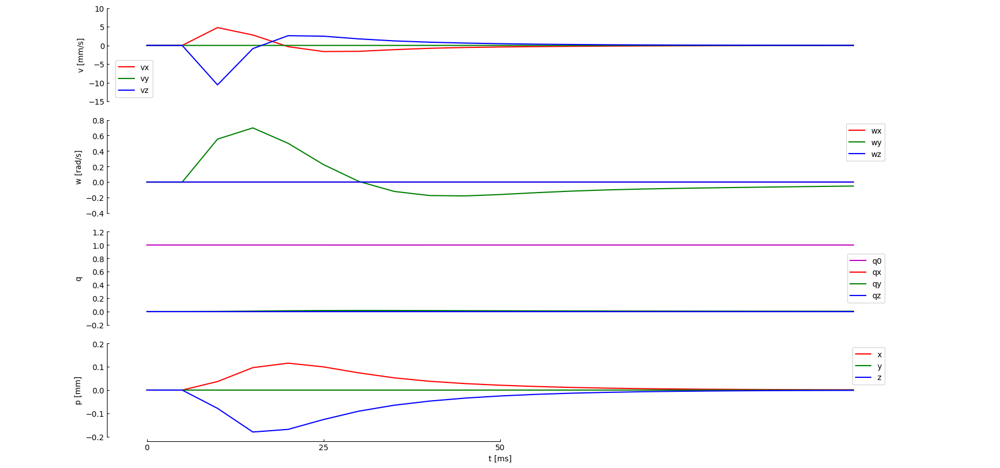

   2  3.8865517e+01 1.16e-04 2.08e+00  -1.0 2.08e-02   2.0 9.91e-01 9.94e-01f  1
   3  1.9238535e+01 3.84e-04 9.24e+00  -1.0 2.85e-02   1.5 1.00e+00 1.00e+00f  1
   4  1.9424163e+01 8.00e-07 4.71e-01  -1.0 6.70e-04   2.9 1.00e+00 1.00e+00f  1
   5  1.2970713e+01 1.48e-05 1.86e+00  -1.7 7.85e-03   2.4 1.00e+00 1.00e+00f  1
   6  3.6076620e+00 1.94e-05 1.15e+00  -1.7 1.45e-02   1.9 1.00e+00 1.00e+00f  1
   7  4.8600133e+00 3.33e-05 9.74e-02  -1.7 4.36e-03   1.4 1.00e+00 1.00e+00f  1
   8  1.1767302e+00 5.18e-06 3.50e-01  -2.5 4.98e-03   1.8 1.00e+00 1.00e+00f  1
   9  6.9237919e-01 5.02e-06 9.95e-02  -2.5 4.25e-03   1.4 1.00e+00 1.00e+00f  1
iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
  10  7.1478862e-01 2.95e-05 8.59e-02  -2.5 1.10e-02   0.9 1.00e+00 1.00e+00f  1
  11  7.0559421e-01 1.04e-04 5.65e-02  -2.5 2.17e-02   0.4 1.00e+00 1.00e+00h  1
  12  7.0335644e-01 9.38e-06 4.72e-02  -2.5 6.80e-03   0.8 1.00e+00 1.00e+00h  1
  13  6.9973295e-01 2.42e-05

1/1 [==============================] - 0s 14ms/step
x hover
[[-2.94033530e-02]
 [ 3.91639601e-08]
 [ 1.99059759e-02]
 [-1.76941588e-07]
 [-5.16776325e-02]
 [ 1.66238117e-07]
 [ 9.99990381e-01]
 [ 7.12140777e-09]
 [ 4.38607412e-03]
 [-9.96663030e-09]
 [ 0.00000000e+00]
 [ 0.00000000e+00]
 [ 0.00000000e+00]]

uL hover
[[0.57180321]
 [0.16961161]
 [0.51630583]
 [0.34018078]
 [0.36452449]
 [0.11110448]
 [0.81070598]
 [0.60212018]
 [0.35913146]
 [0.38550873]
 [0.52916885]
 [0.43482897]]

uR hover
[[0.57180324]
 [0.1696116 ]
 [0.51630583]
 [0.34018081]
 [0.36452452]
 [0.11110448]
 [0.81070598]
 [0.60212019]
 [0.35913149]
 [0.38550876]
 [0.52916887]
 [0.43482899]]

1050
[-1.8  0.5  1.8]
[-1.8 -0.5  1.8]
1050
[-1.8  0.5  1.8]
[-1.8 -0.5  1.8]


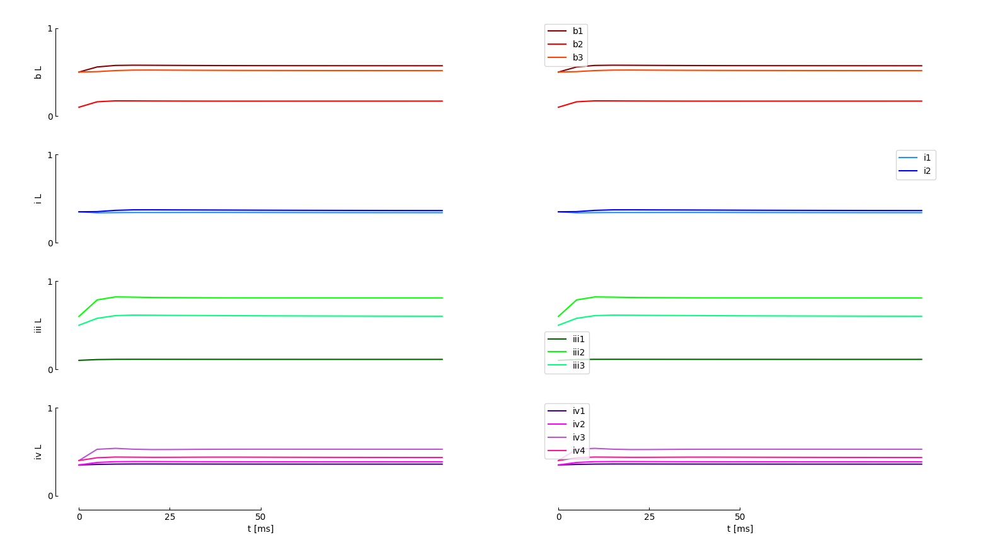

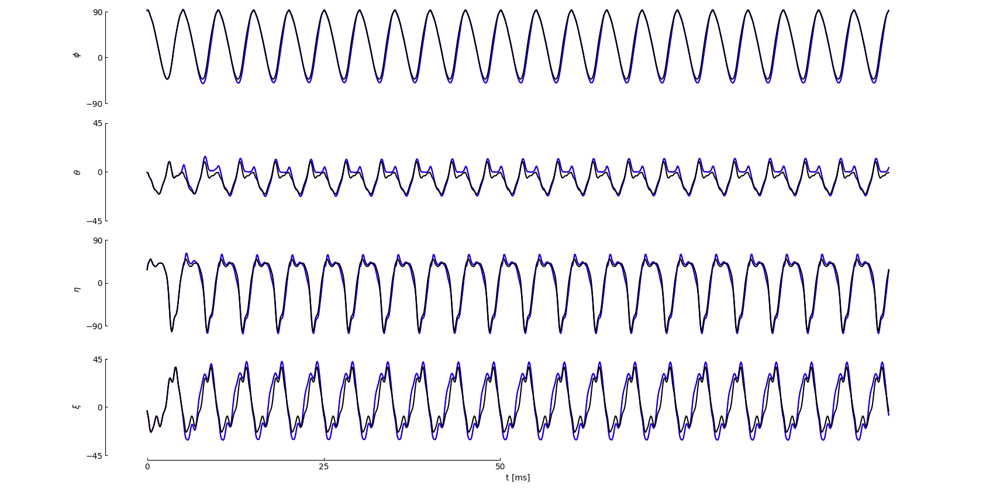

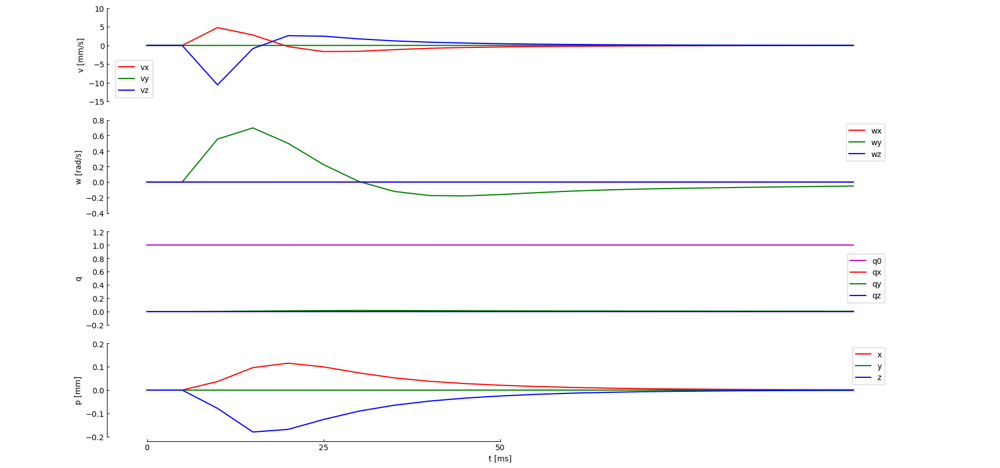

In [5]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 20 # number of wingbeats in which the fly should achieve the goal state

# initial pitch orientation (pitch down is positive, pitch up negative):
beta_init = 0.0/180.0*np.pi

# initial velocity:
v_init = 0.0

# initial state
x_init = [np.cos(beta_init)*v_init,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_init)*-v_init, # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_init/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_init/2.0),     # qy
          0.0,                       # qz
          0.0,                       # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 0.0/180.0*np.pi

# goal velocity:
v_goal = 0.0

# goal distance:
p_goal = 0.0

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          p_goal,                    # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [1.0,  # vx
             1.0,  # vy
             1.0,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.1,  # px
             1.0,  # py
             0.1]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = np.array([[0.5],[0.1],[0.5],[0.35],[0.35],[0.1],[0.6],[0.5],[0.35],[0.35],[0.4],[0.4]])

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_init)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# get hovering body state:
x_hover = np.zeros((N_state,1))
x_hover[:3,0] = mpc.x_result[:3,-1]*np.sqrt(mpc.g*mpc.R_fly)
x_hover[3:6,0] = mpc.x_result[3:6,-1]*np.sqrt(mpc.g)/np.sqrt(mpc.R_fly)
x_hover[6:10,0] = mpc.x_result[6:10,-1]

print('x hover')
print(x_hover)
print('')

# get hovering muscle activity:
uL_hover = np.zeros((12,1))
uL_hover[:,0] = mpc.uL_result[:,-1]
print('uL hover')
print(uL_hover)
print('')

uR_hover = np.zeros((12,1))
uR_hover[:,0] = mpc.uR_result[:,-1]
print('uR hover')
print(uR_hover)
print('')

# make video:
snapshot_dir = mpc.plots_dir+'/hover_flight'

mpc.make_video('hover',3,snapshot_dir,10)
mpc.make_video2('hover_stat',0,snapshot_dir,10)

#### Forward flight maneuver

We will now use our MPC model to simulate the transition from hovering flight to forward flight

[[0.57180325]
 [0.16961158]
 [0.51630587]
 [0.34018085]
 [0.3645246 ]
 [0.11110449]
 [0.81070598]
 [0.6021203 ]
 [0.35913148]
 [0.38550875]
 [0.52916888]
 [0.43482908]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6208

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

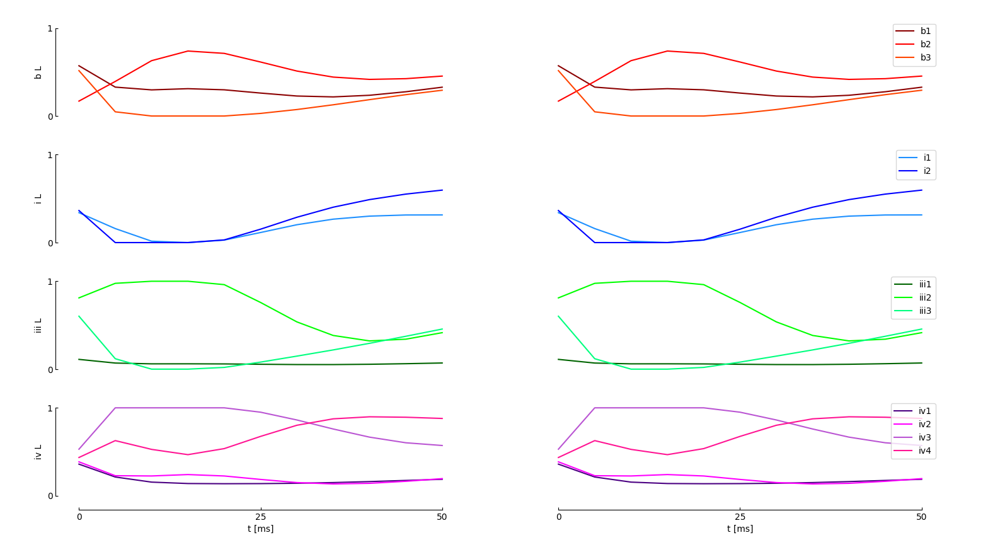

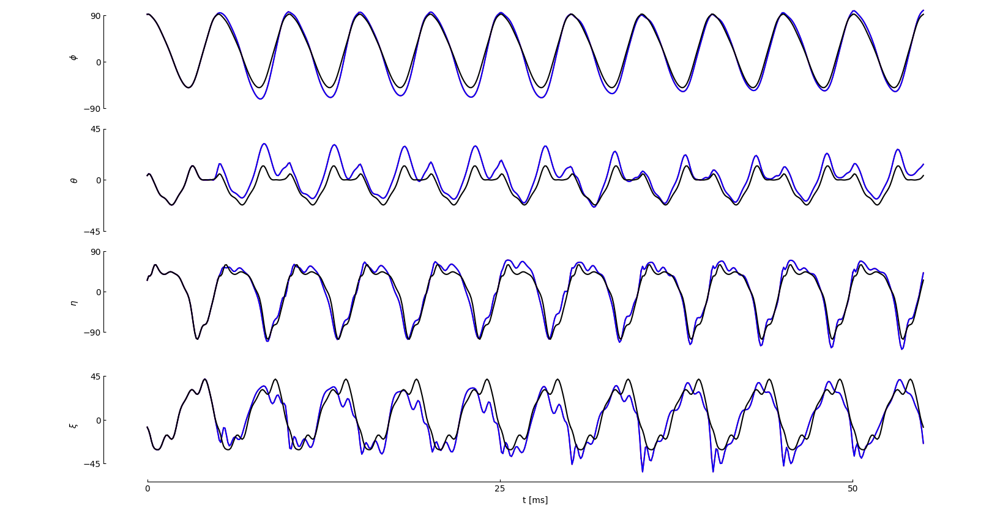

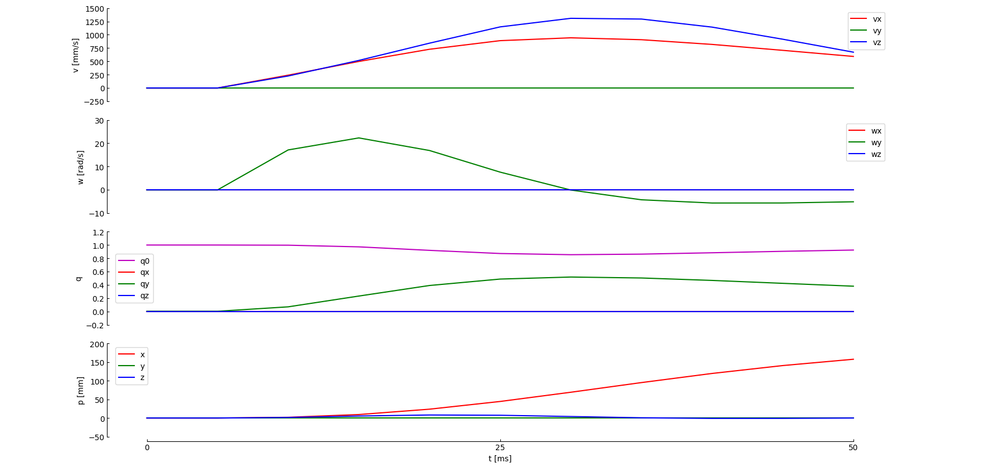

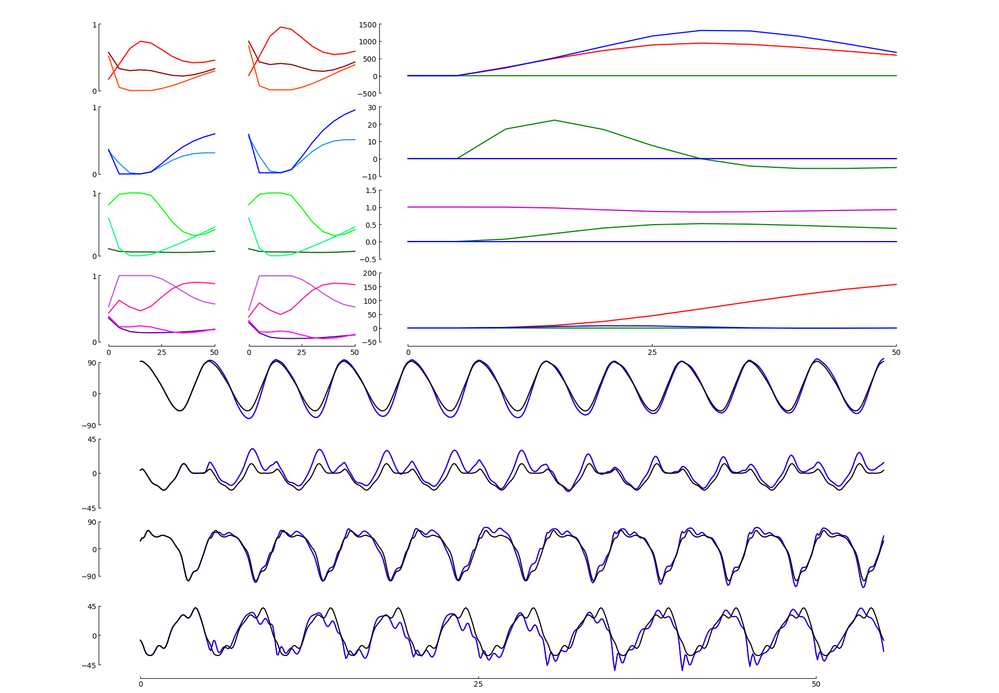

In [6]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 35.0/180.0*np.pi

# goal velocity:
v_goal = 200.0 # mm/s

# goal distance:
p_goal = 200.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          p_goal,                    # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             1.0,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.001,  # px
             1.0,  # py
             0.01]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_hover
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_hover)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# Save directory:
snapshot_dir = mpc.plots_dir+'/forward'

# Plot oversight:
mpc.plot_oversight('forward',snapshot_dir)

# make video:
mpc.make_video('forward',3,snapshot_dir,10)
mpc.make_video2('forward_stat',0,snapshot_dir,10)

#### Backward flight maneuver

We use our MPC model to simulate backward flight.

[[0.57180325]
 [0.16961158]
 [0.51630587]
 [0.34018085]
 [0.3645246 ]
 [0.11110449]
 [0.81070598]
 [0.6021203 ]
 [0.35913148]
 [0.38550875]
 [0.52916888]
 [0.43482908]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6208

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

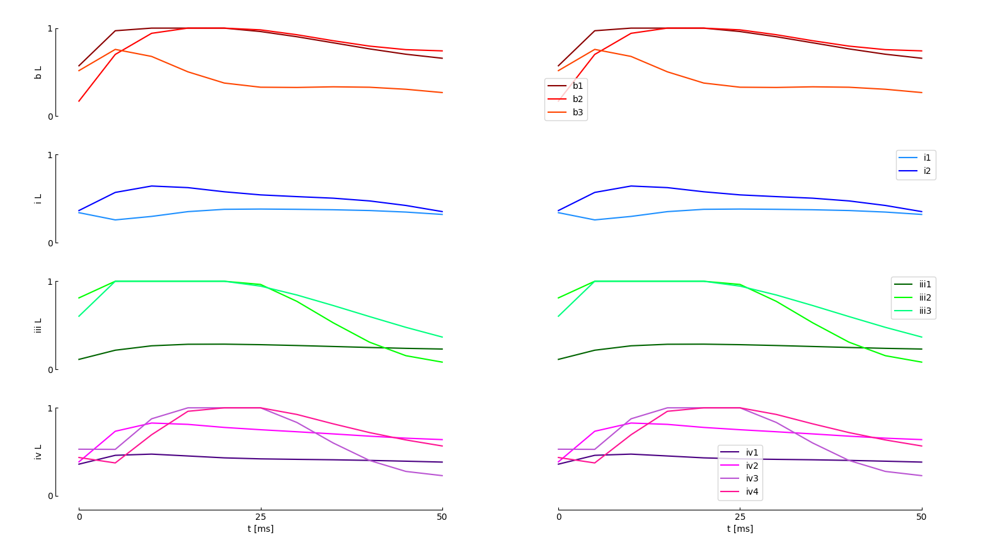

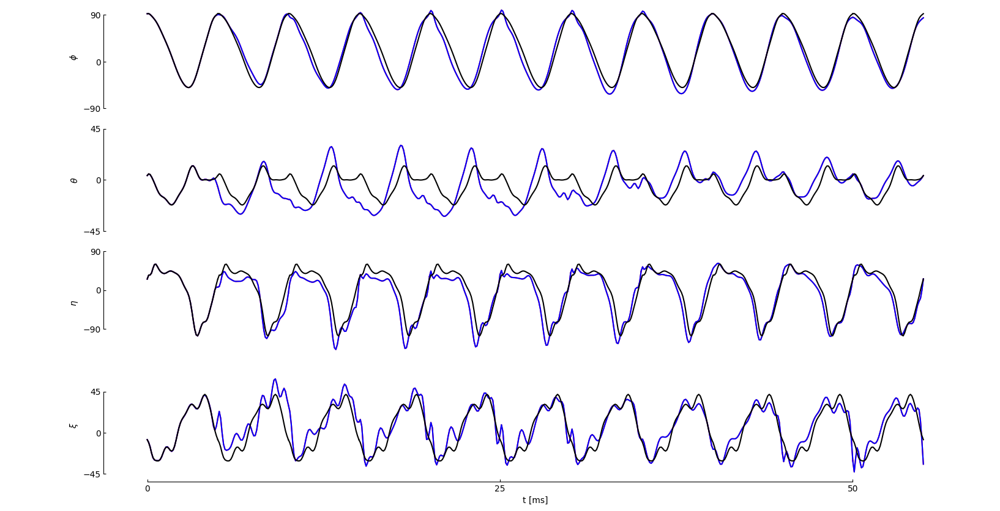

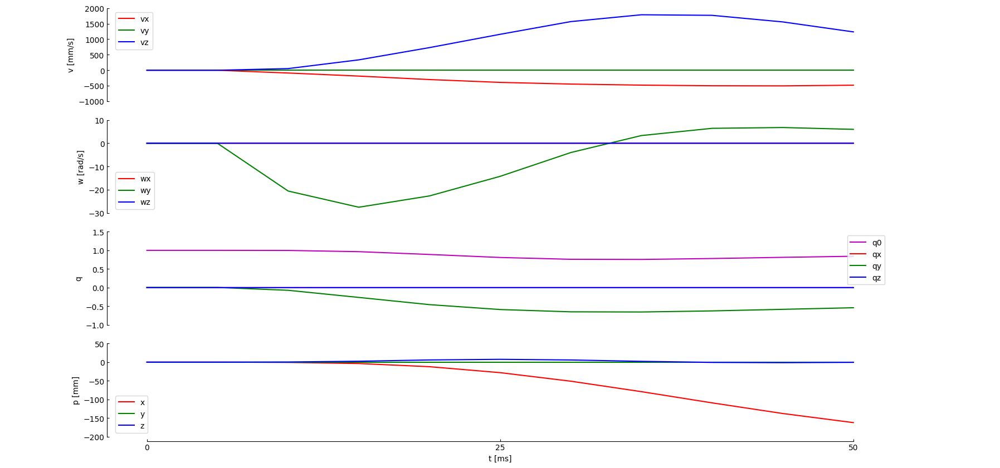

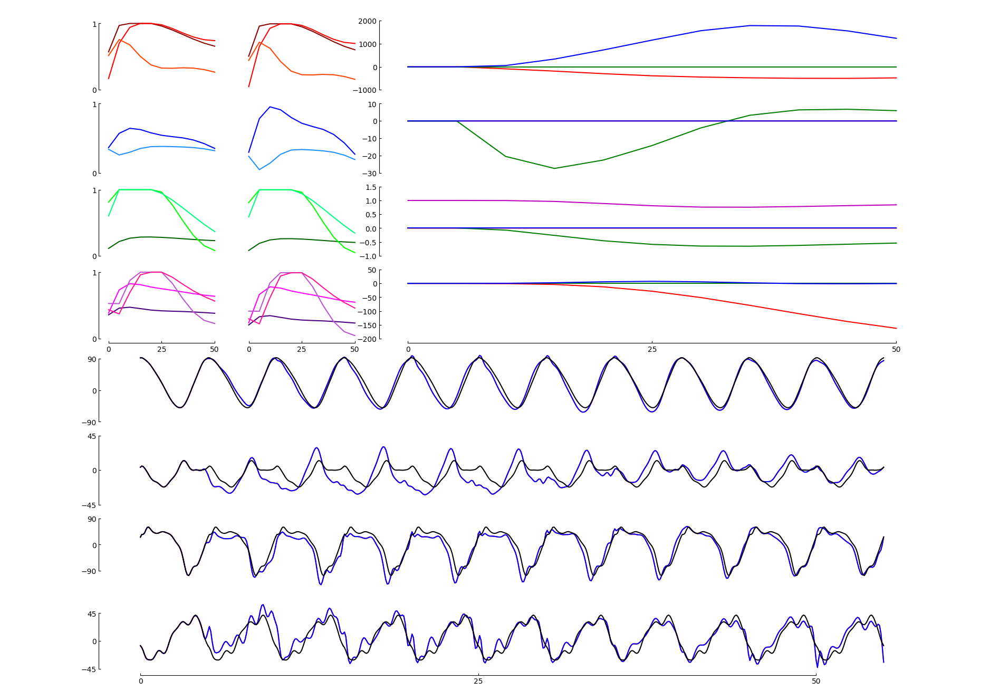

In [7]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = -35.0/180.0*np.pi

# goal velocity:
v_goal = 200.0 # mm/s

# goal distance:
p_goal = -200.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          p_goal,                    # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.001,  # vx
             1.0,  # vy
             0.001,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.001,  # px
             1.0,  # py
             0.01]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_hover
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_hover)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/backward'

# Plot oversight:
mpc.plot_oversight('backward',snapshot_dir)

mpc.make_video('backward',3,snapshot_dir,10)
mpc.make_video2('backward_stat',0,snapshot_dir,10)

#### Sideward flight maneuver

We use our MPC model to simulate sideward flight.

[[0.57180325]
 [0.16961158]
 [0.51630587]
 [0.34018085]
 [0.3645246 ]
 [0.11110449]
 [0.81070598]
 [0.6021203 ]
 [0.35913148]
 [0.38550875]
 [0.52916888]
 [0.43482908]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

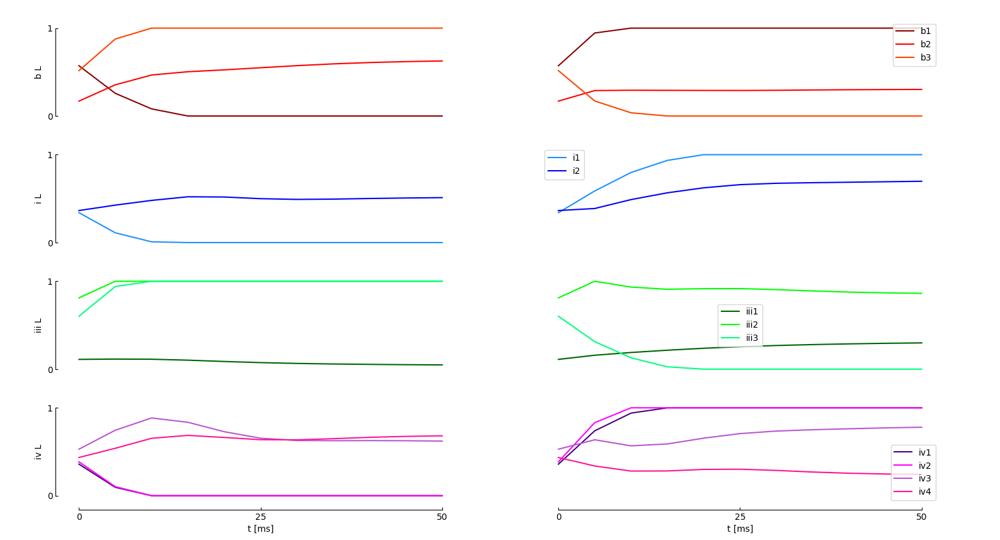

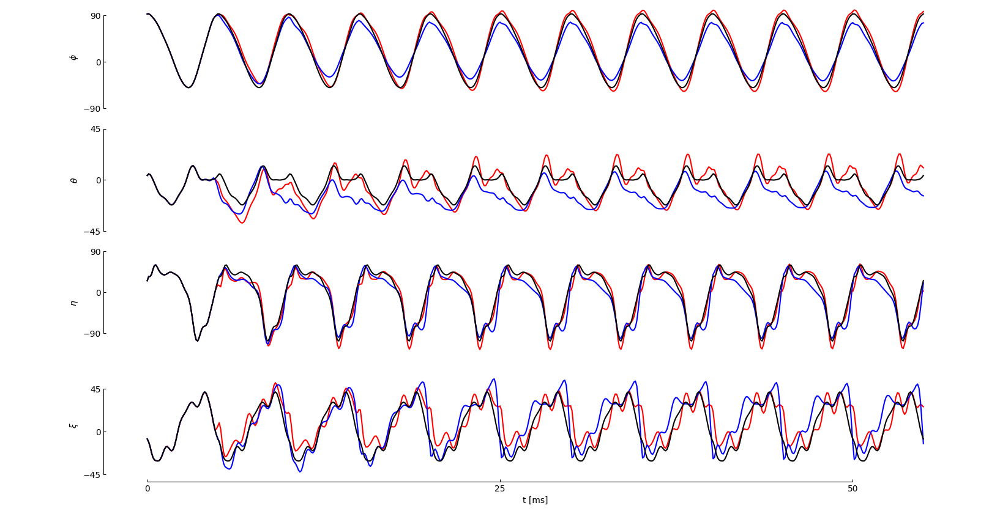

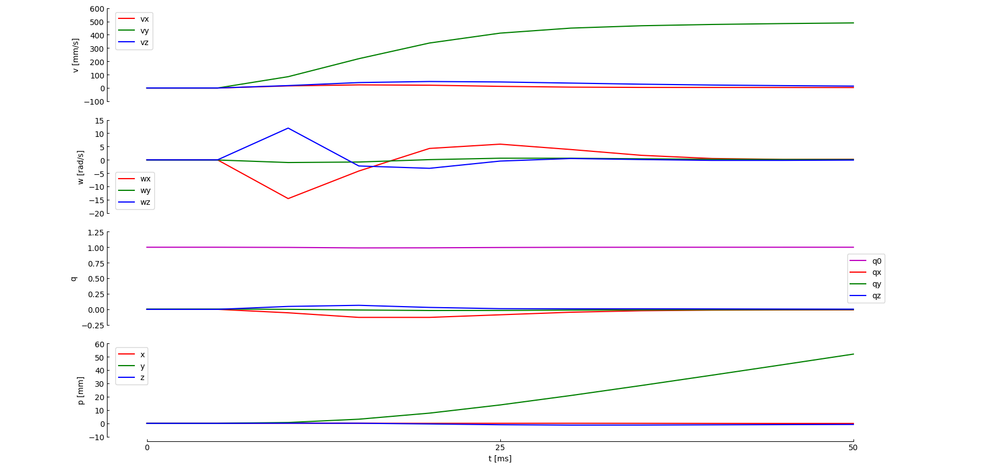

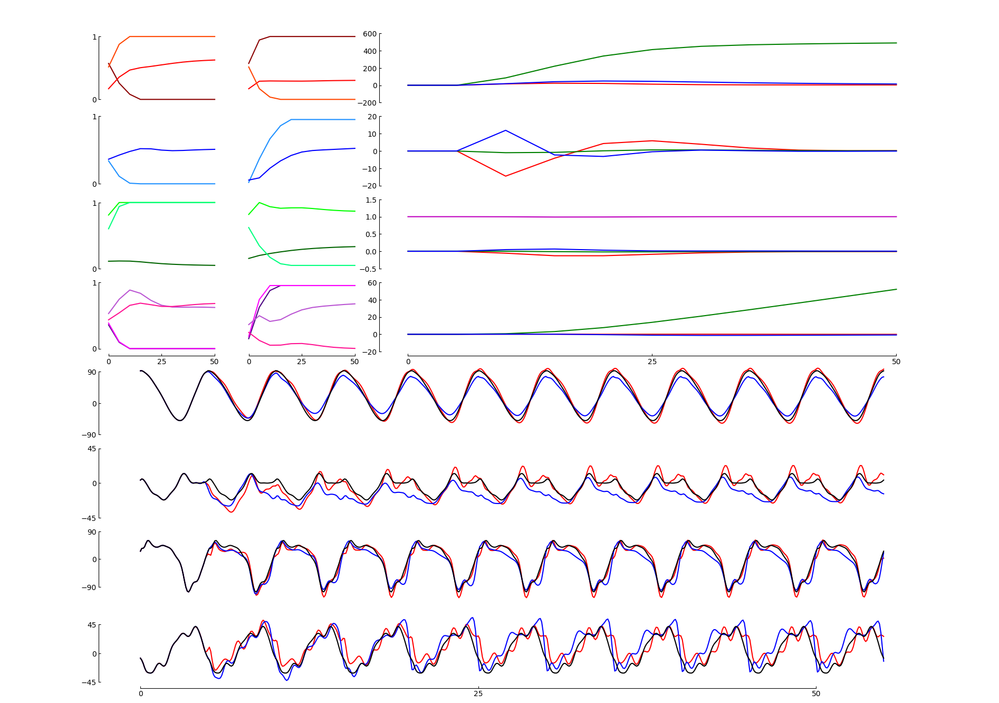

In [8]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = -0.0/180.0*np.pi

# goal velocity:
v_goal = 200.0 # mm/s

# goal distance:
p_goal = 200.0 # mm

# goal state
x_goal = [0.0,                       # vx [mm/s]
          v_goal,                    # vy [mm/s]
          0.0,                       # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          0.0,                       # px [mm]
          p_goal,                    # py [mm]
          0.0]                       # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [1.0,  # vx
             0.1,  # vy
             1.0,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.1,  # px
             0.001,  # py
             0.1]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_hover
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_hover)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/sideward'

# Plot oversight:
mpc.plot_oversight('sideward',snapshot_dir)

mpc.make_video('sideward',4,snapshot_dir,10)
mpc.make_video2('sideward_stat',0,snapshot_dir,10)

#### Upward flight

We simulate upward flight by specifying an upward flight velocity of 200 mm/s.

[[0.57180325]
 [0.16961158]
 [0.51630587]
 [0.34018085]
 [0.3645246 ]
 [0.11110449]
 [0.81070598]
 [0.6021203 ]
 [0.35913148]
 [0.38550875]
 [0.52916888]
 [0.43482908]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6197

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

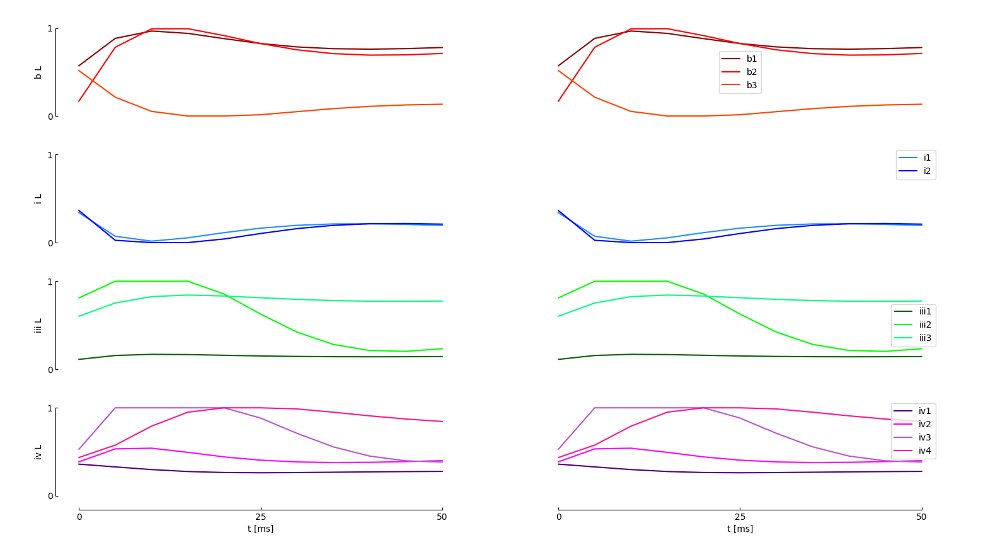

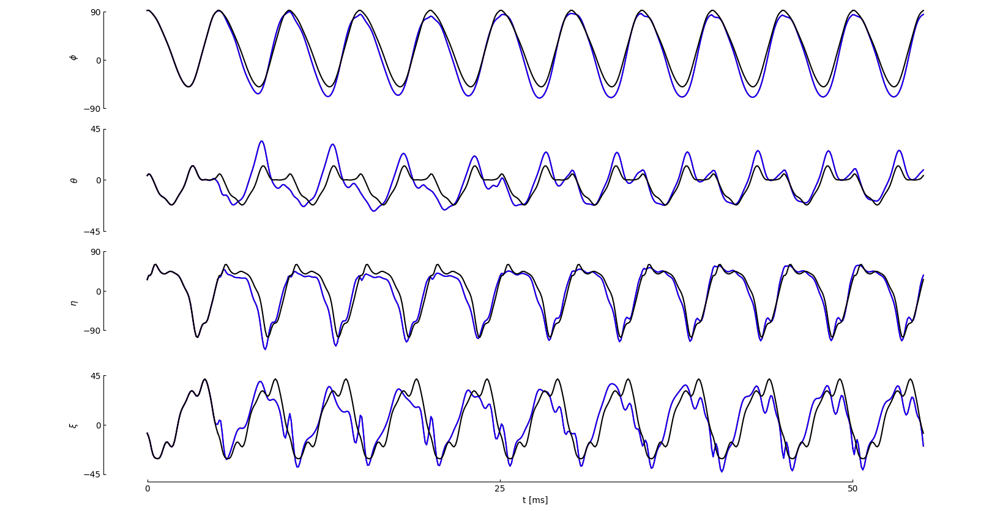

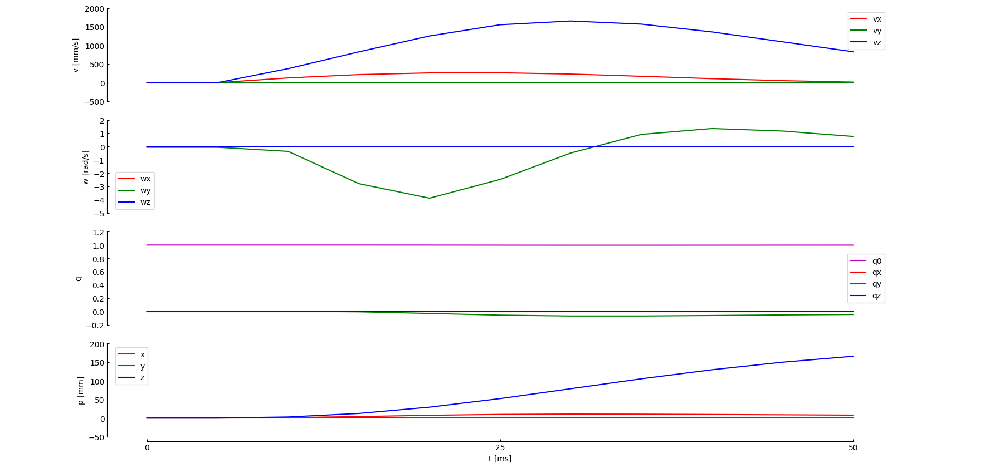

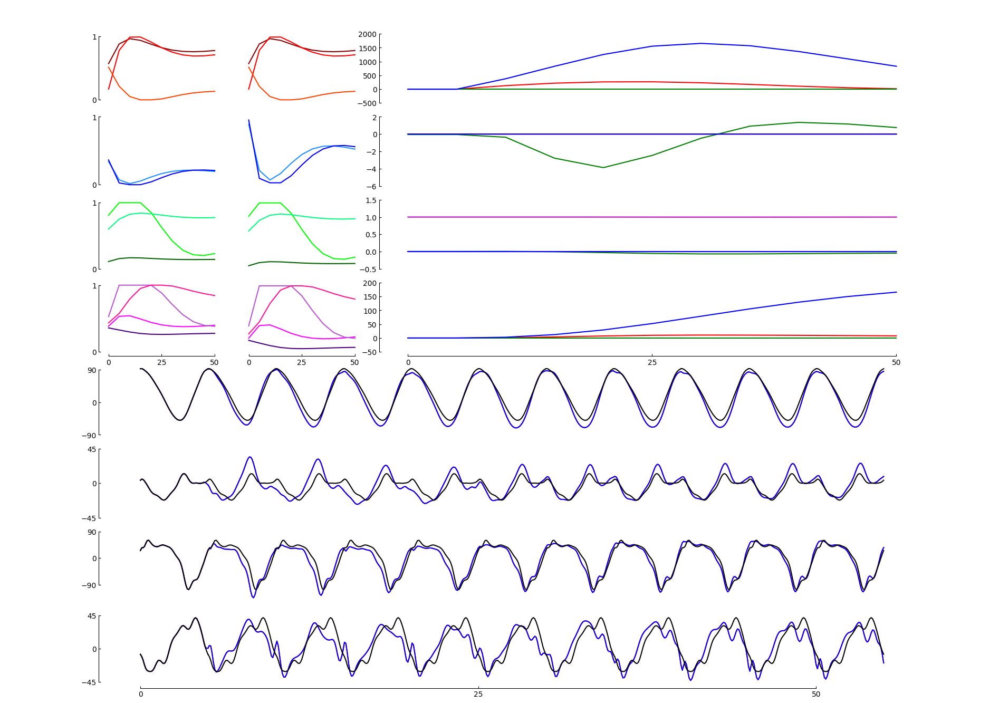

In [9]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 0.0/180.0*np.pi

# goal velocity:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 0.0/180.0*np.pi

# goal velocity:
v_goal = 200.0 # mm/s

# goal distance:
p_goal = 200.0 # mm

# goal state
x_goal = [0.0,                       # vx [mm/s]
          0.0,                       # vy [mm/s]
          v_goal,                    # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          0.0,                       # px [mm]
          0.0,                       # py [mm]
          p_goal]                    # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             1.0,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.0,  # px
             1.0,  # py
             0.001]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_hover
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_hover)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/upward'

# Plot oversight:
mpc.plot_oversight('upward',snapshot_dir)

mpc.make_video('upward',3,snapshot_dir,10)
mpc.make_video2('upward_stat',0,snapshot_dir,10)

#### Downward flight

We simulate downward flight by specifying a downward flight velocity of 200 mm/s

[[0.57180325]
 [0.16961158]
 [0.51630587]
 [0.34018085]
 [0.3645246 ]
 [0.11110449]
 [0.81070598]
 [0.6021203 ]
 [0.35913148]
 [0.38550875]
 [0.52916888]
 [0.43482908]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6197

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

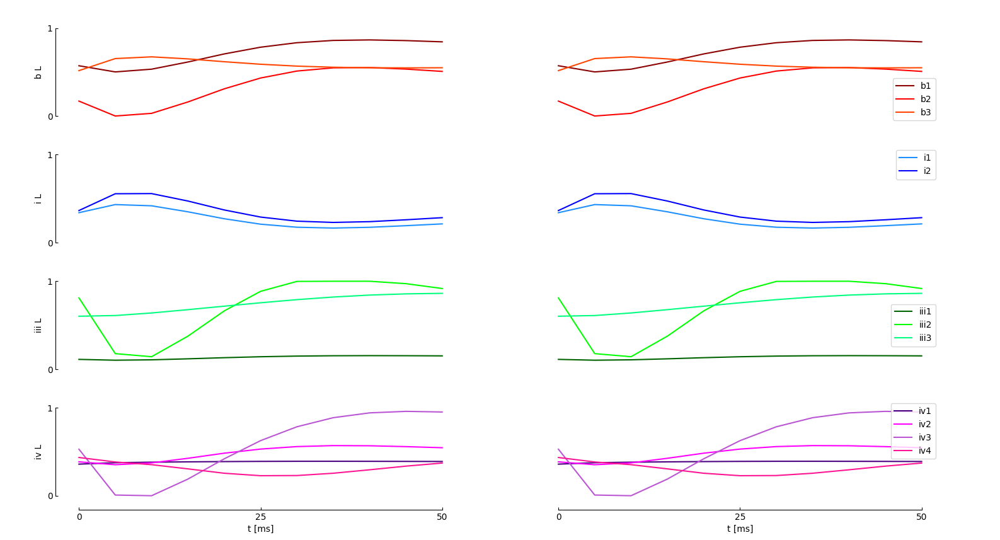

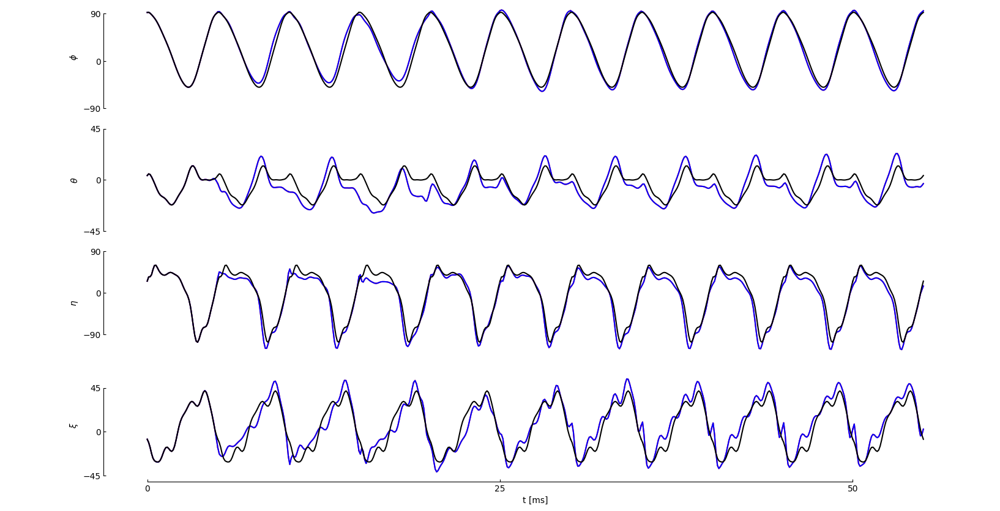

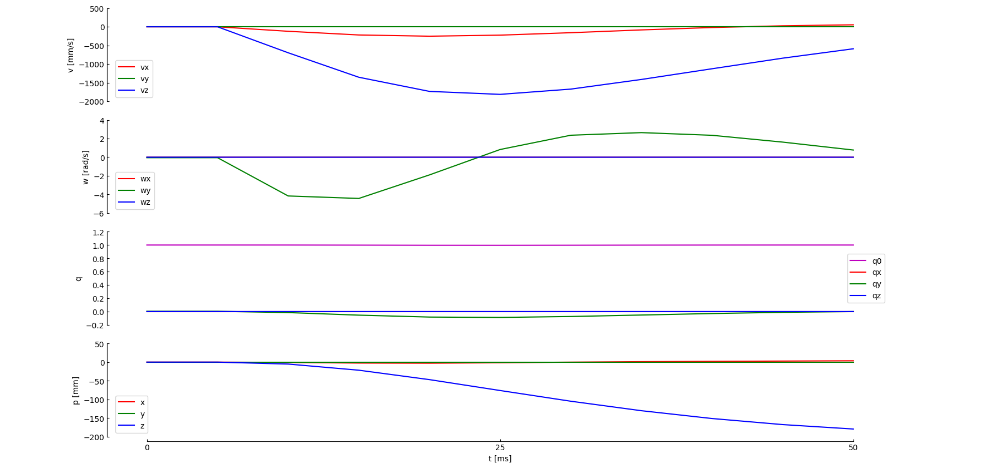

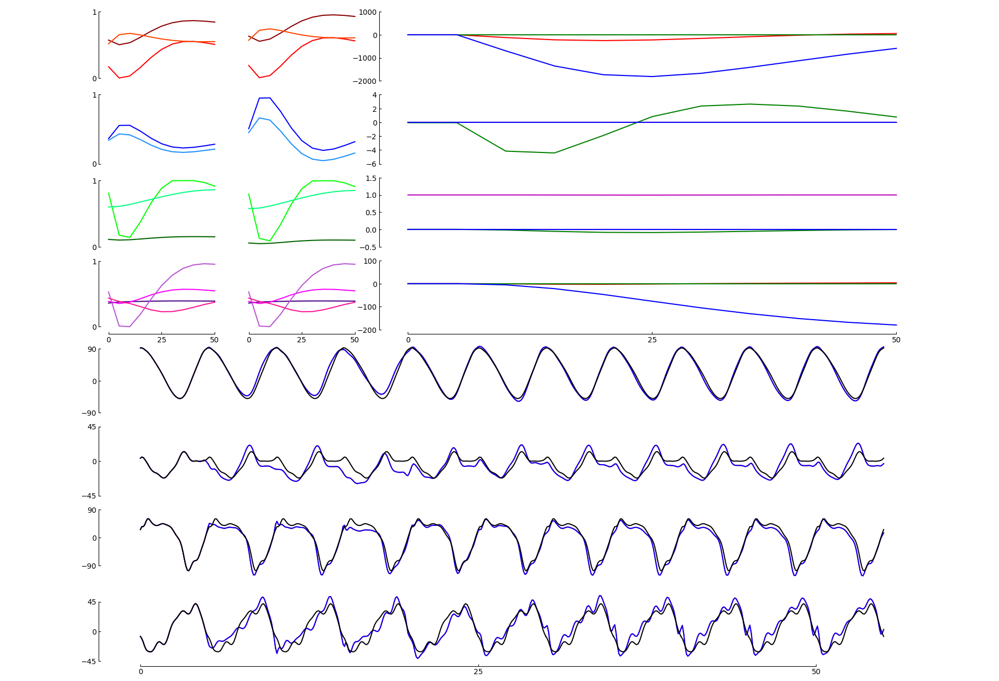

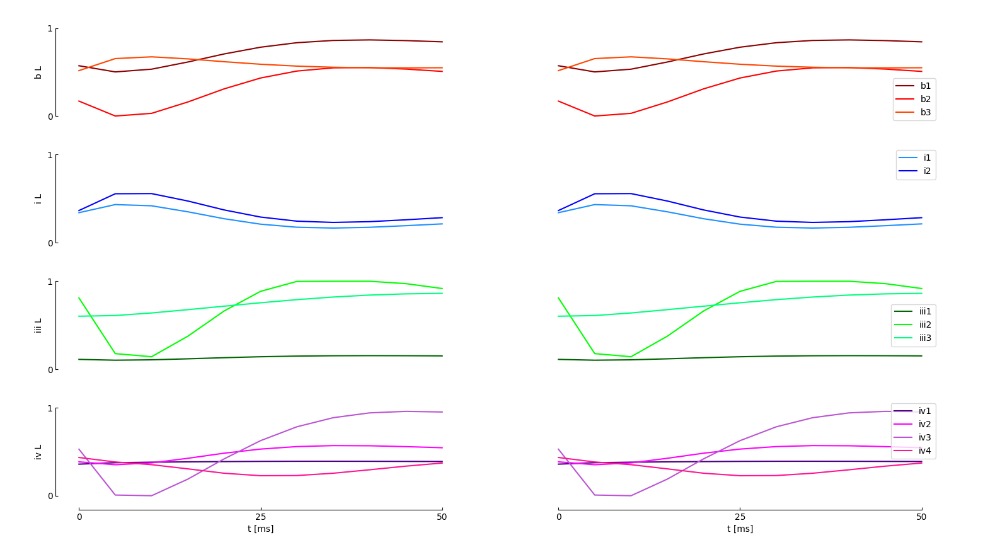

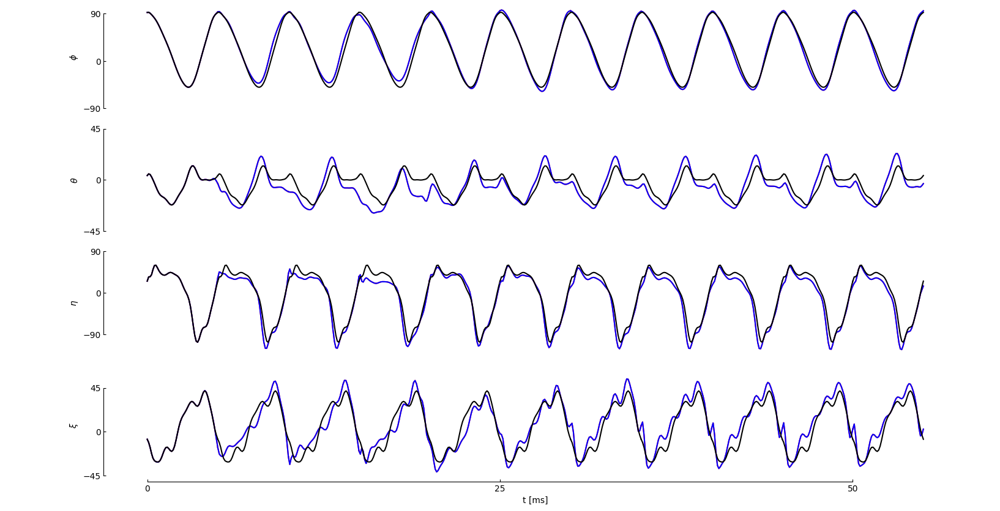

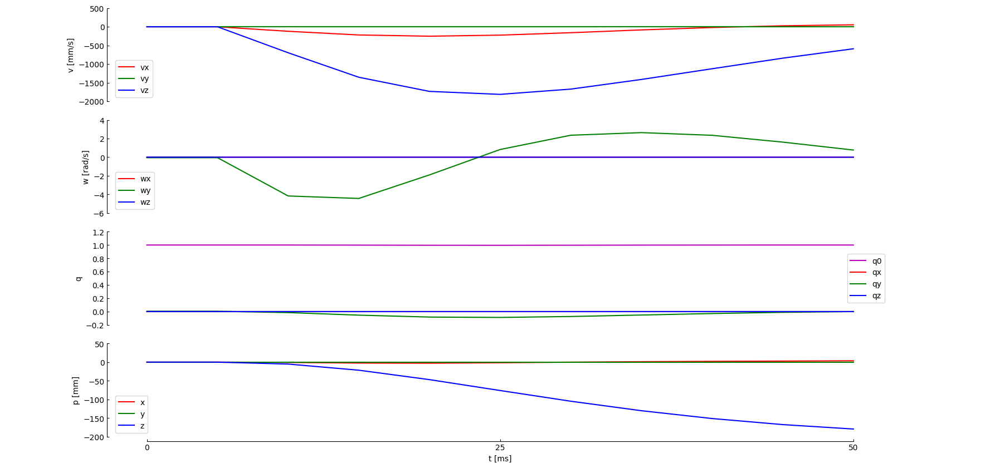

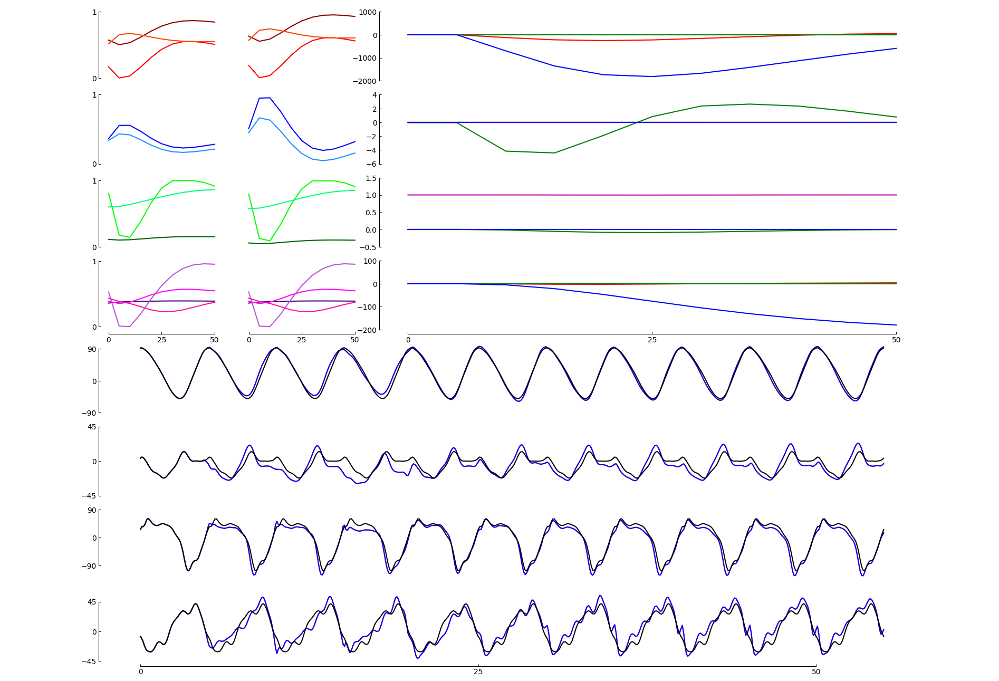

In [10]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 0.0/180.0*np.pi

# goal velocity:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 0.0/180.0*np.pi

# goal velocity:
v_goal = -200.0 # mm/s

# goal distance:
p_goal = -200.0 # mm

# goal state
x_goal = [0.0,                       # vx [mm/s]
          0.0,                       # vy [mm/s]
          v_goal,                    # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          0.0,                       # px [mm]
          0.0,                       # py [mm]
          p_goal]                    # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             1.0,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.0,  # px
             1.0,  # py
             0.001]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_hover
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_hover)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/downward'

# Plot oversight:
mpc.plot_oversight('downward',snapshot_dir)

mpc.make_video('downward',3,snapshot_dir,10)
mpc.make_video2('downward_stat',0,snapshot_dir,10)

#### Forward speed

We use the MPC model to find the state vector and muscle activity for forward flight at 500 mm/s.

This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6186

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        0

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  1.1926814e+01 9.83e-01 4.50e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

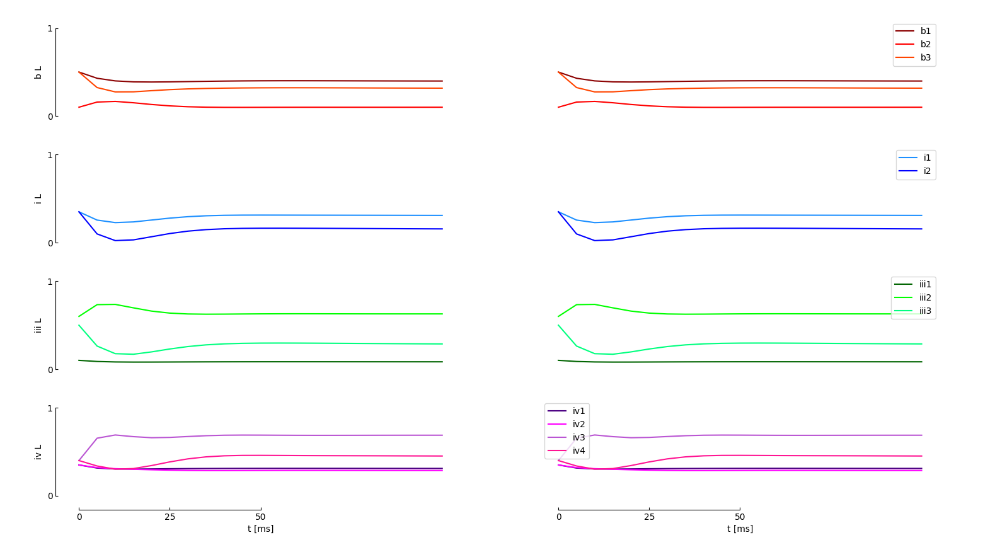

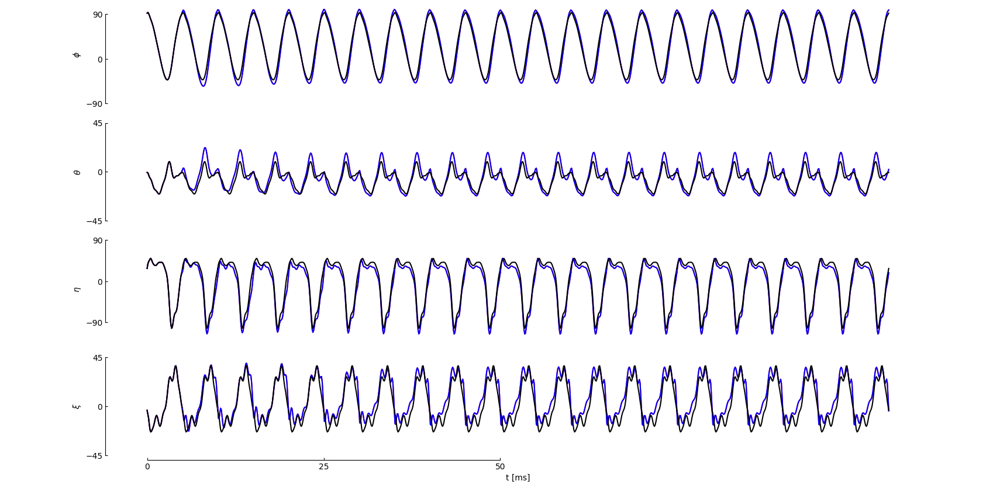

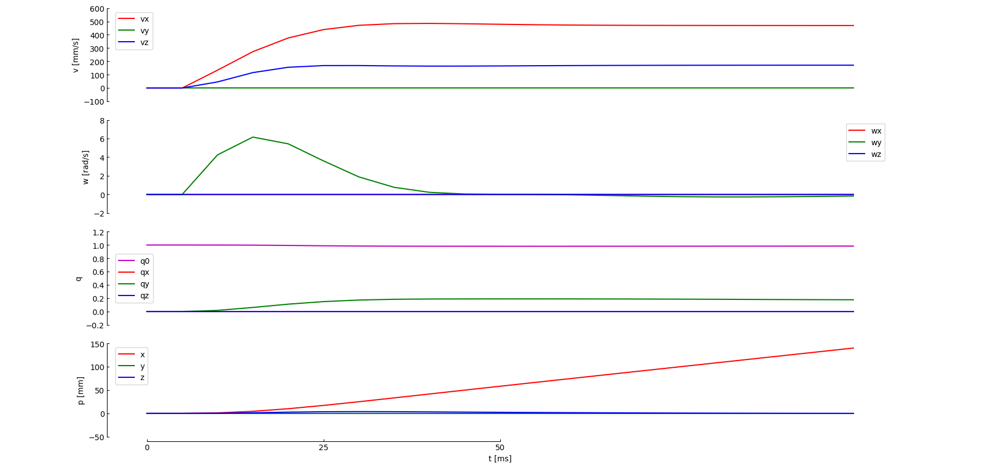

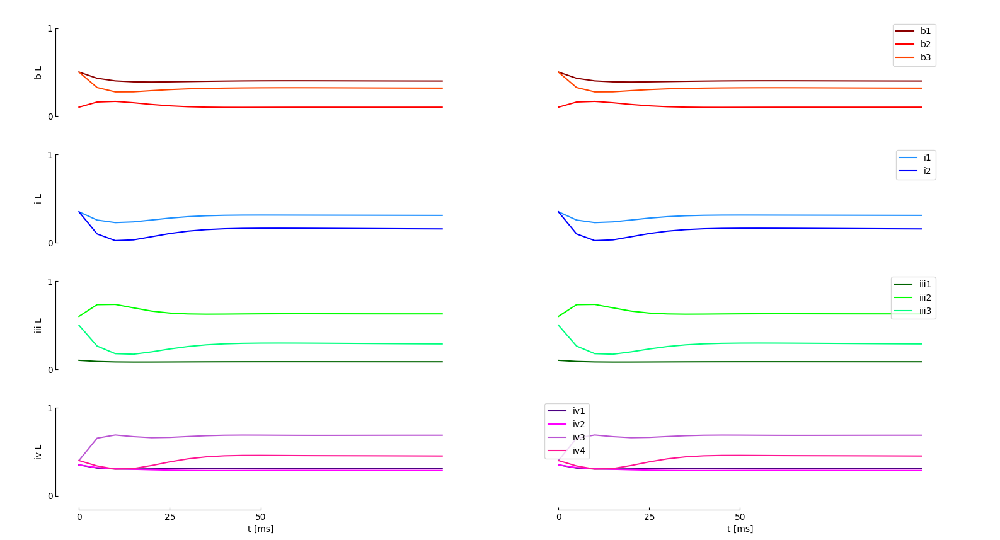

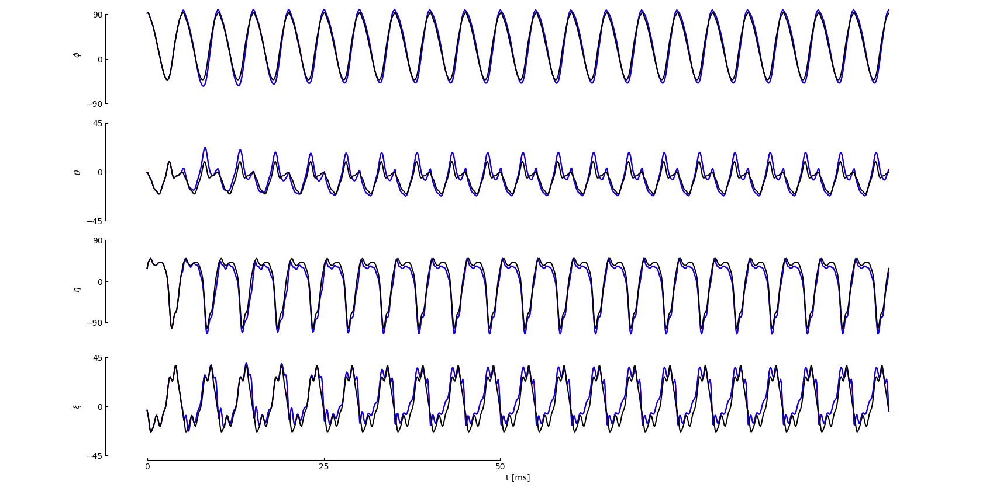

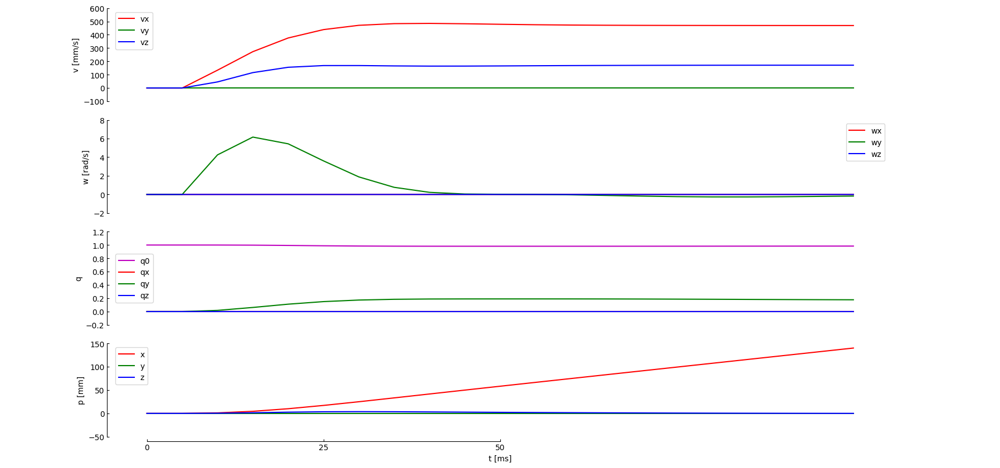

In [11]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 20 # number of wingbeats in which the fly should achieve the goal state

# initial pitch orientation (pitch down is positive, pitch up negative):
beta_init = 0.0/180.0*np.pi

# initial velocity:
v_init = 0.0

# initial state
x_init = [np.cos(beta_init)*v_init,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_init)*-v_init, # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_init/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_init/2.0),     # qy
          0.0,                       # qz
          0.0,                       # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi

# goal velocity:
v_goal = 500.0

# goal distance:
p_goal = 0.0

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(beta_goal/2.0),     # q0
          0.0,                       # qx
          np.sin(beta_goal/2.0),     # qy
          0.0,                       # qz
          p_goal,                    # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.1,  # vx
             1.0,  # vy
             0.1,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             1.0,  # qx
             0.1,  # qy
             1.0,  # qz 
             0.0,  # px
             0.0,  # py
             0.001]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = np.array([[0.5],[0.1],[0.5],[0.35],[0.35],[0.1],[0.6],[0.5],[0.35],[0.35],[0.4],[0.4]])

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_init)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# get hovering body state:
x_forward = np.zeros((N_state,1))
x_forward[:3,0] = mpc.x_result[:3,-1]*np.sqrt(mpc.g*mpc.R_fly)
x_forward[3:6,0] = mpc.x_result[3:6,-1]*np.sqrt(mpc.g)/np.sqrt(mpc.R_fly)
x_forward[6:10,0] = mpc.x_result[6:10,-1]
print('x forward')
print(x_forward)
print('')

# get hovering muscle activity:
uL_forward = np.zeros((12,1))
uL_forward[:,0] = mpc.uL_result[:,-1]
print('uL forward')
print(uL_forward)
print('')

uR_forward = np.zeros((12,1))
uR_forward[:,0] = mpc.uR_result[:,-1]
print('uR forward')
print(uR_forward)
print('')

# make video:
snapshot_dir = mpc.plots_dir+'/forward_flight'

mpc.make_video('forward',3,snapshot_dir,10)
mpc.make_video2('forward_stat',0,snapshot_dir,10)

#### Saccade to the left

We start in the forward flight mode at a velocity of 500 mm/s. The goal is to achieve a 90 degree turn to the left with a forward flight velocity of 500 mm/s.

[[0.39784742]
 [0.09985816]
 [0.31684762]
 [0.30896843]
 [0.15565985]
 [0.08353185]
 [0.62860968]
 [0.28716471]
 [0.31046841]
 [0.28683996]
 [0.6881206 ]
 [0.45182334]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

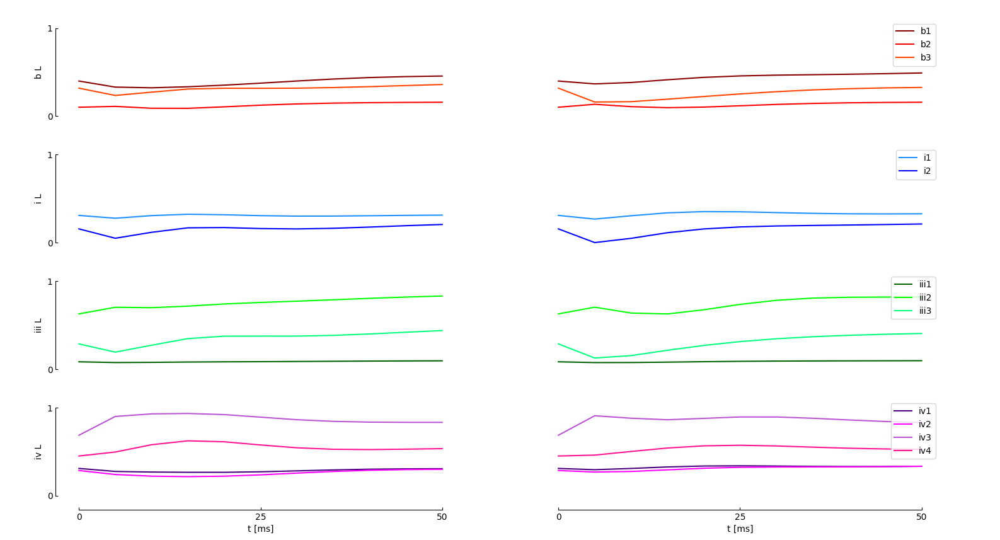

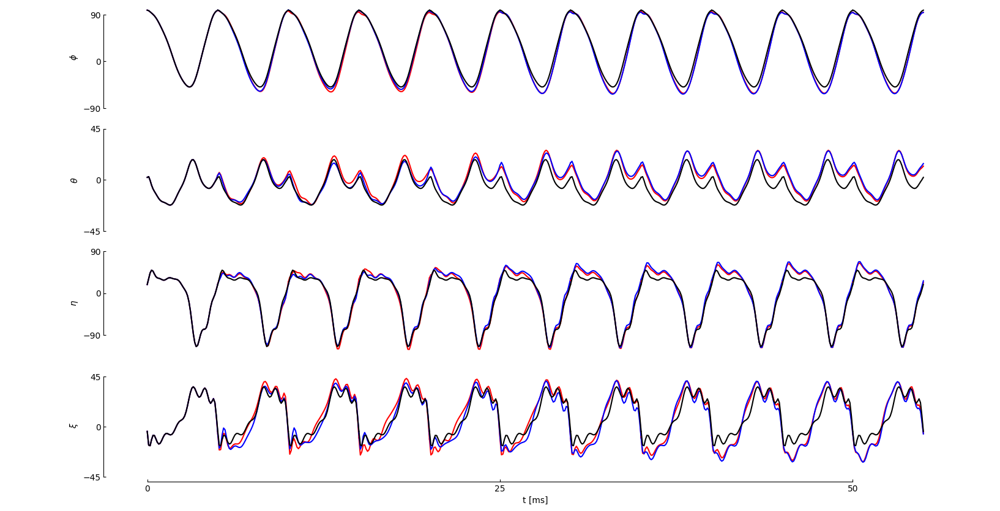

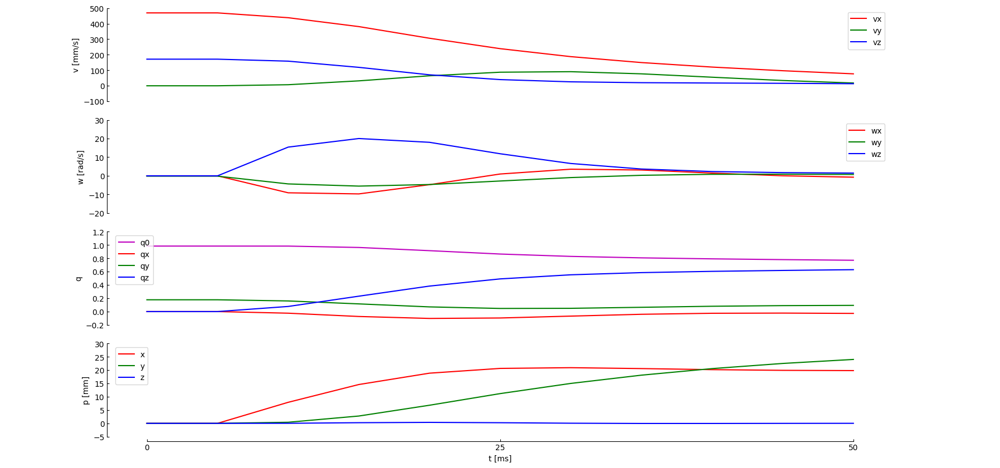

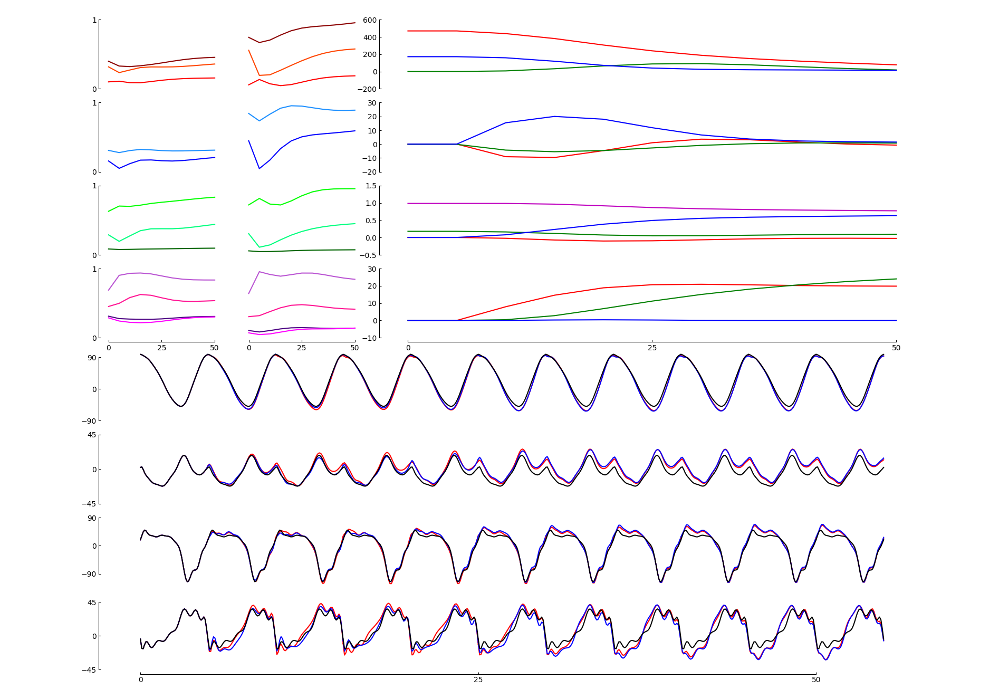

In [12]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi
xsi_goal = 90.0/180.0*np.pi

# goal velocity:
v_goal = 500.0 # mm/s

# goal distance:
p_goal = 20.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(xsi_goal/2.0),      # q0
          0.0,                       # qx
          0.0,                       # qy
          np.sin(xsi_goal/2.0),      # qz
          p_goal,                    # px [mm]
          p_goal,                    # py [mm]
          0.0]                       # pz [mm]

[1.0,0.0,1.0,0.0,0.0,0.0,np.cos(np.pi/4.0),0.0,0.0,np.sin(np.pi/4.0),10.0,10.0,0.0]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             0.01,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.1,  # px
             0.001,  # py
             0.1]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_forward
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_forward)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/saccade_left'

# Plot oversight:
mpc.plot_oversight('saccade_L',snapshot_dir)

mpc.make_video('saccade_L',2,snapshot_dir,10)
mpc.make_video2('saccade_L_stat',0,snapshot_dir,10)

#### Saccade to the right

We start in forward flight mode at a velocity of 500 mm/s. The goal is to achieve a 90 degree turn to the right with a forward flight velocity of 500 mm/s.

[[0.39784742]
 [0.09985816]
 [0.31684762]
 [0.30896843]
 [0.15565985]
 [0.08353185]
 [0.62860968]
 [0.28716471]
 [0.31046841]
 [0.28683996]
 [0.6881206 ]
 [0.45182334]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

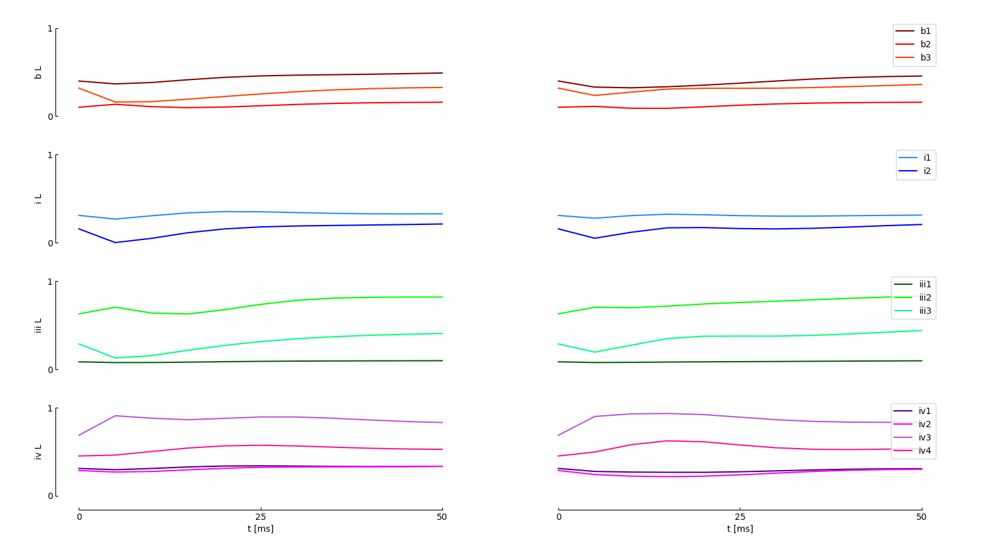

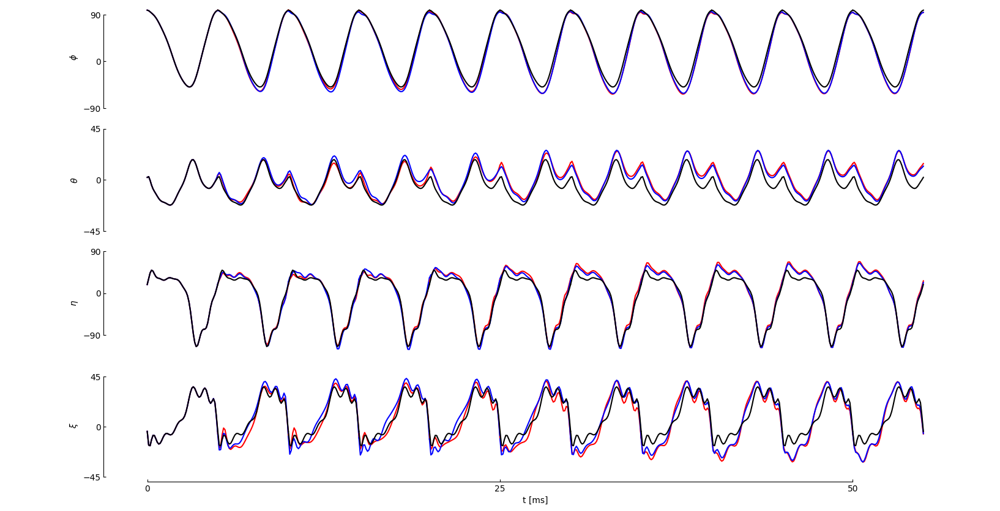

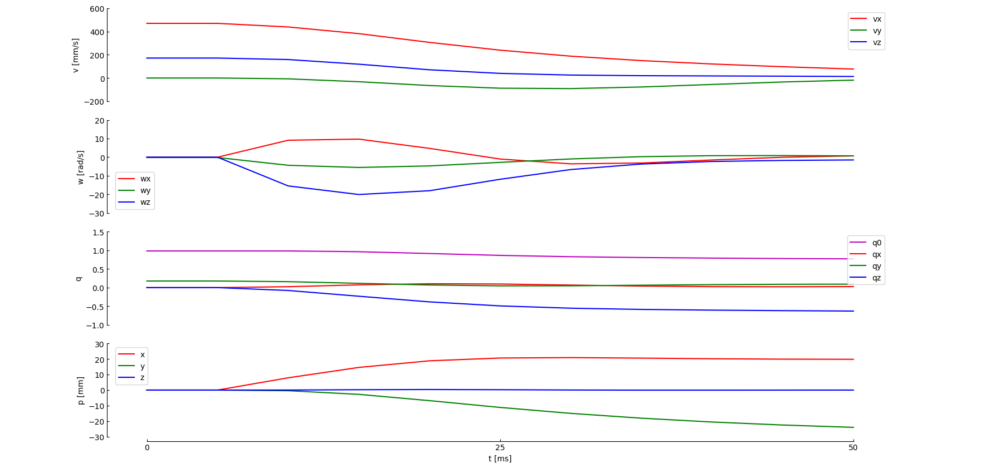

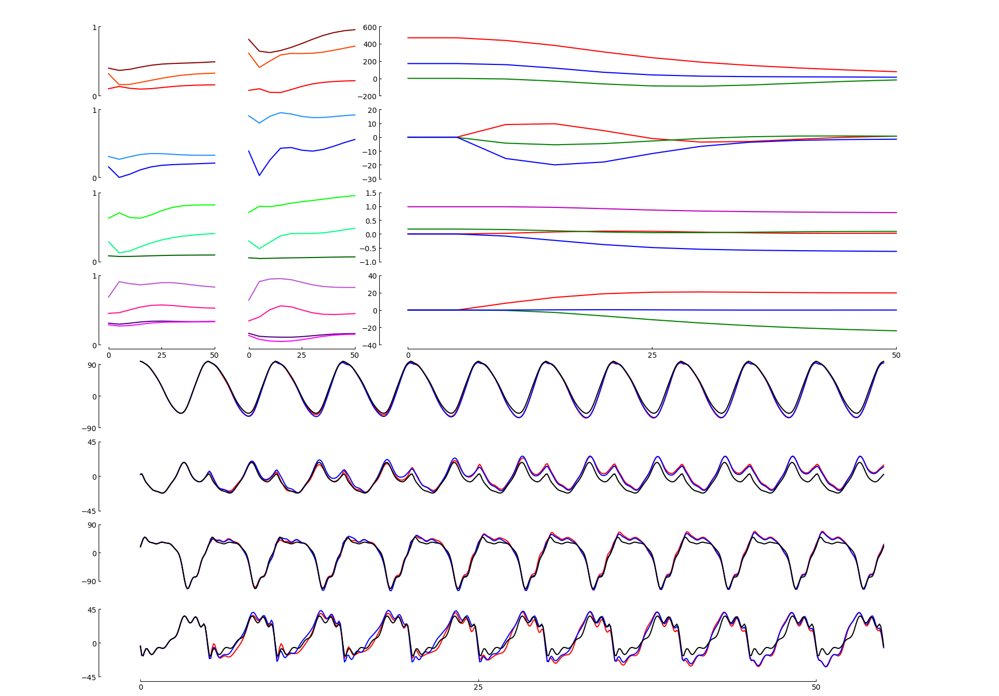

In [13]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi
xsi_goal = -90.0/180.0*np.pi

# goal velocity:
v_goal = 500.0 # mm/s

# goal distance:
p_goal = 20.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(xsi_goal/2.0),      # q0
          0.0,                       # qx
          0.0,                       # qy
          np.sin(xsi_goal/2.0),      # qz
          p_goal,                    # px [mm]
          -p_goal,                    # py [mm]
          0.0]                       # pz [mm]

[1.0,0.0,1.0,0.0,0.0,0.0,np.cos(np.pi/4.0),0.0,0.0,np.sin(np.pi/4.0),10.0,10.0,0.0]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             0.01,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.1,  # px
             0.001,  # py
             0.1]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_forward
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_forward)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/saccade_right'

# Plot oversight:
mpc.plot_oversight('saccade_R',snapshot_dir)

mpc.make_video('saccade_R',2,snapshot_dir,10)
mpc.make_video2('saccade_R_stat',0,snapshot_dir,10)

#### Loom stimulus from the left

We simulate an escape maneuver from a loom stimulus coming from the righ by starting in forward flight mode and specifying a point 500 mm to the right.

[[0.39784742]
 [0.09985816]
 [0.31684762]
 [0.30896843]
 [0.15565985]
 [0.08353185]
 [0.62860968]
 [0.28716471]
 [0.31046841]
 [0.28683996]
 [0.6881206 ]
 [0.45182334]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

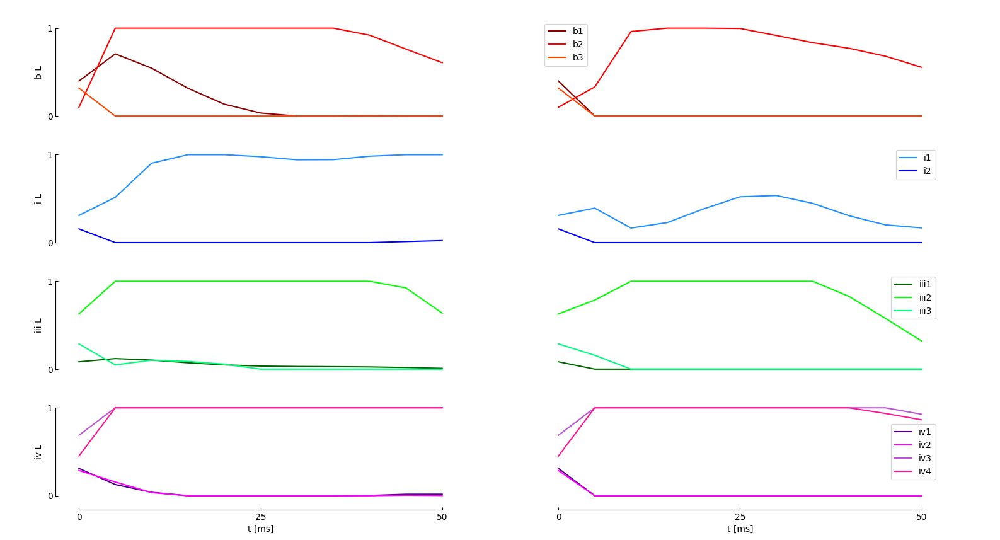

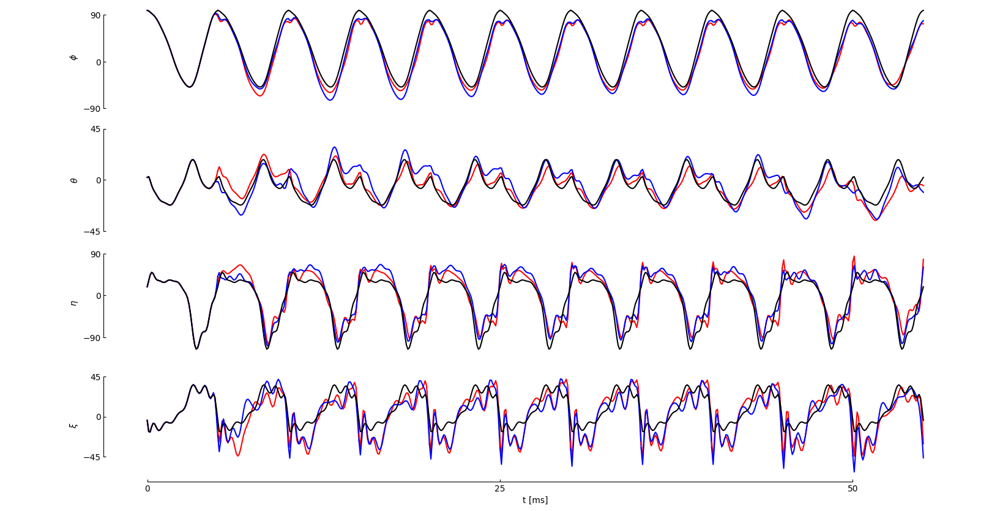

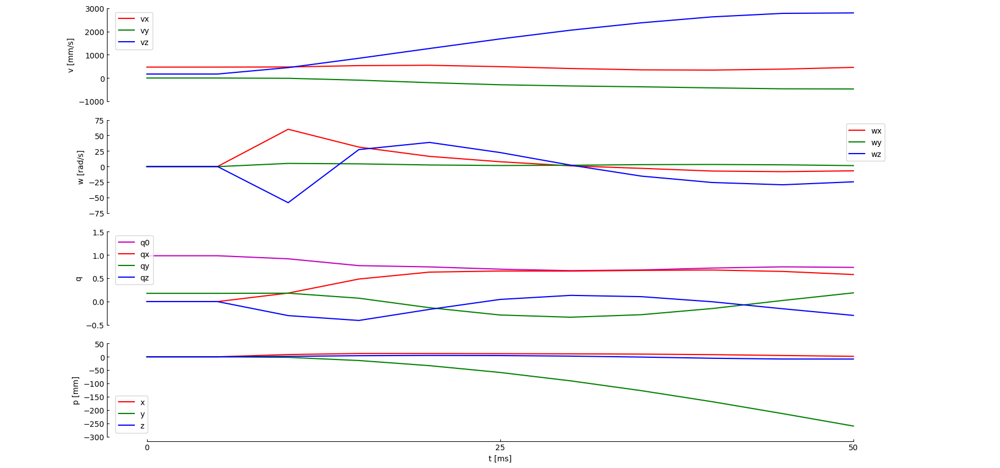

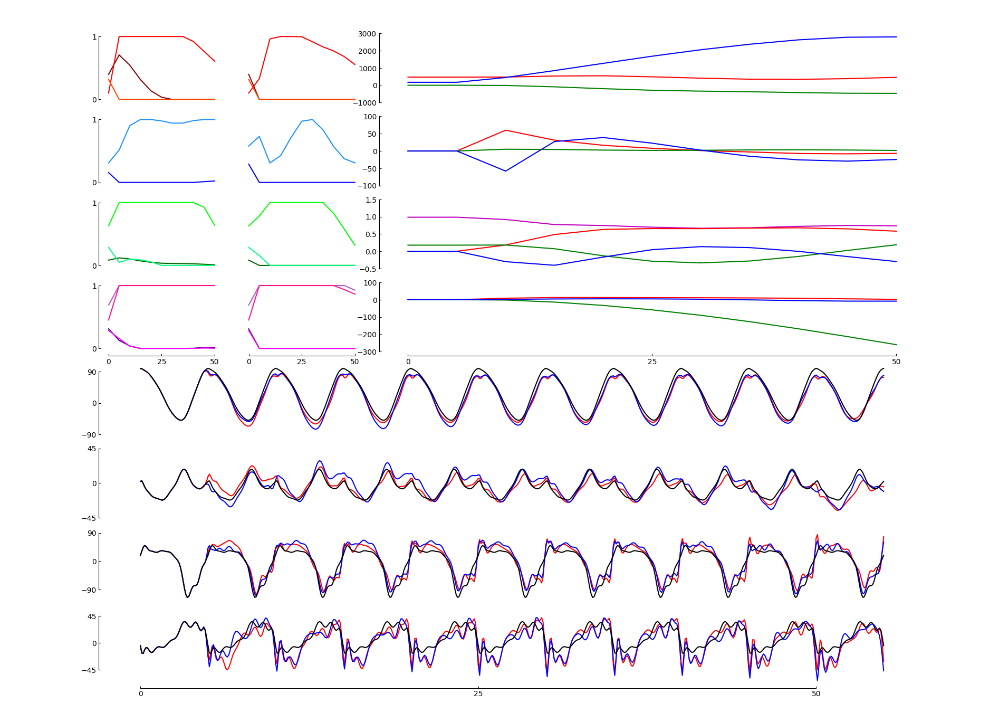

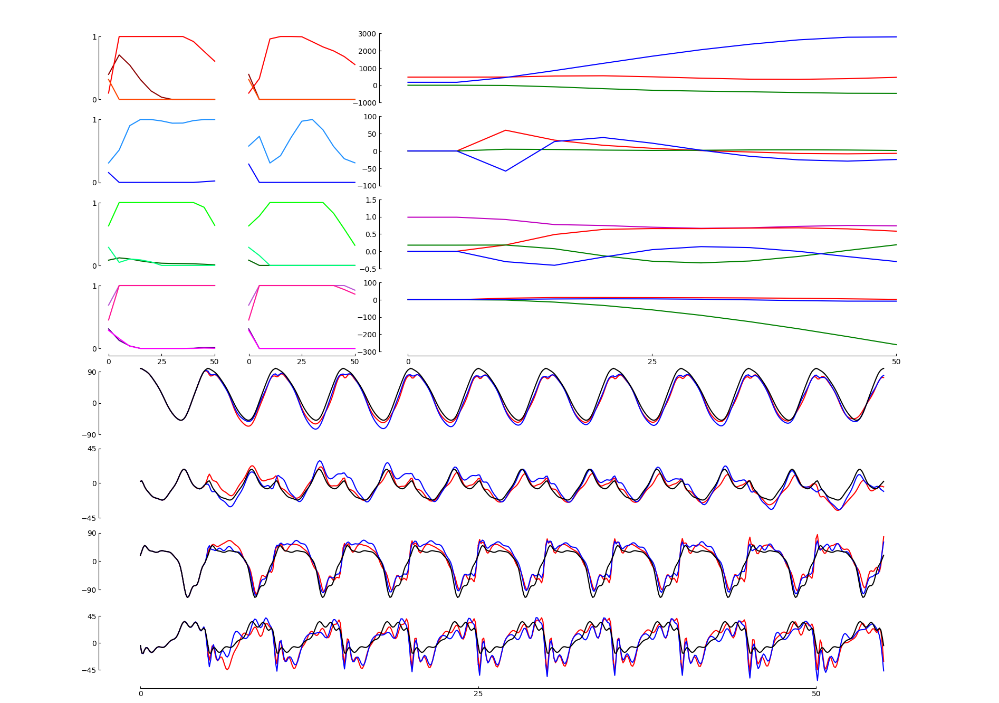

In [14]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi
xsi_goal = -90.0/180.0*np.pi

# goal velocity:
v_goal = 1000.0 # mm/s

# goal distance:
p_goal = -500.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(xsi_goal/2.0),      # q0
          0.0,                       # qx
          0.0,                       # qy
          np.sin(xsi_goal/2.0),      # qz
          0.0,                    # px [mm]
          p_goal,                    # py [mm]
          0.0]                       # pz [mm]

[1.0,0.0,1.0,0.0,0.0,0.0,np.cos(np.pi/4.0),0.0,0.0,np.sin(np.pi/4.0),10.0,10.0,0.0]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             0.01,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.001,  # px
             0.001,  # py
             0.001]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_forward
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_forward)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/loom_left'

# Plot oversight:
mpc.plot_oversight('loom_L',snapshot_dir)

mpc.make_video('loom_L',2,snapshot_dir,10)
mpc.make_video2('loom_L_stat',0,snapshot_dir,10)

#### Loom stimulus from the right

We simulate an escape maneuver from a loom stimulus coming from the left by starting in forward flight mode and specifying a point 500 mm to the left.

[[0.39784742]
 [0.09985816]
 [0.31684762]
 [0.30896843]
 [0.15565985]
 [0.08353185]
 [0.62860968]
 [0.28716471]
 [0.31046841]
 [0.28683996]
 [0.6881206 ]
 [0.45182334]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

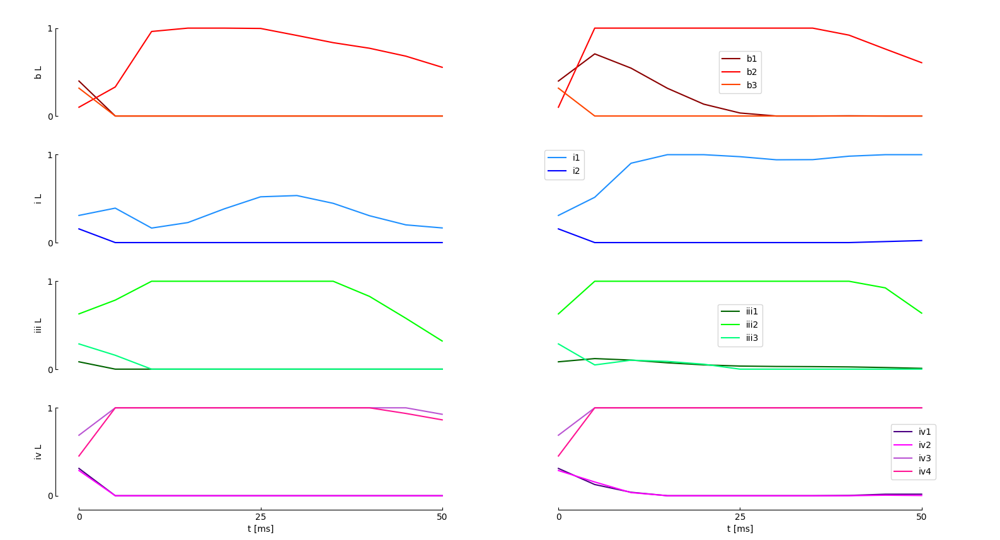

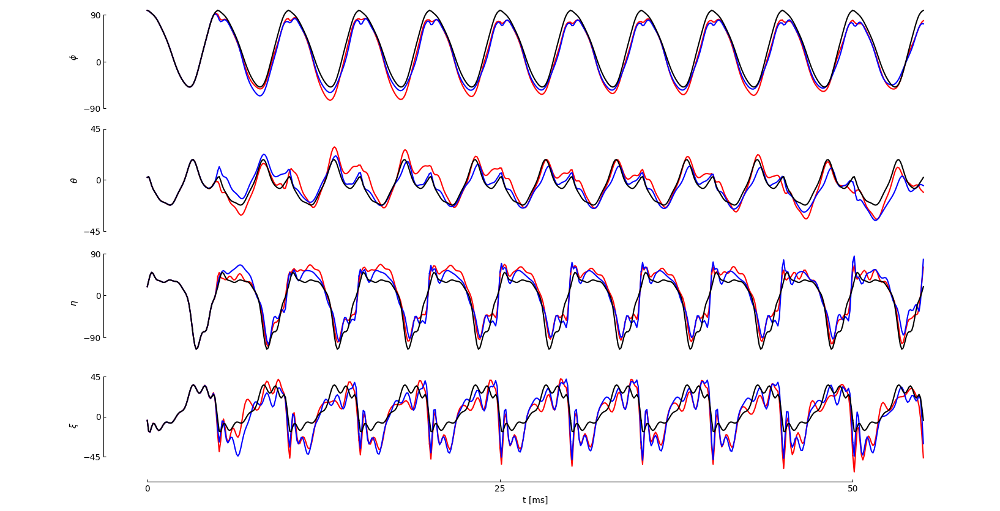

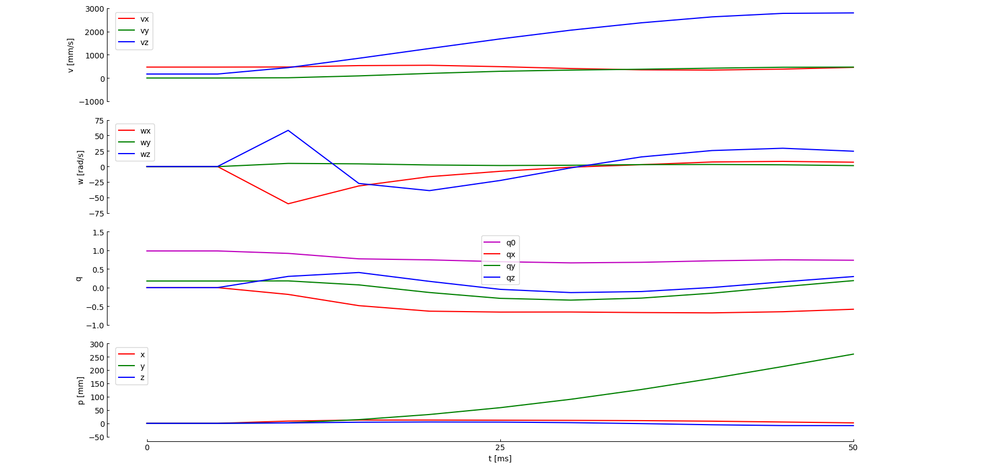

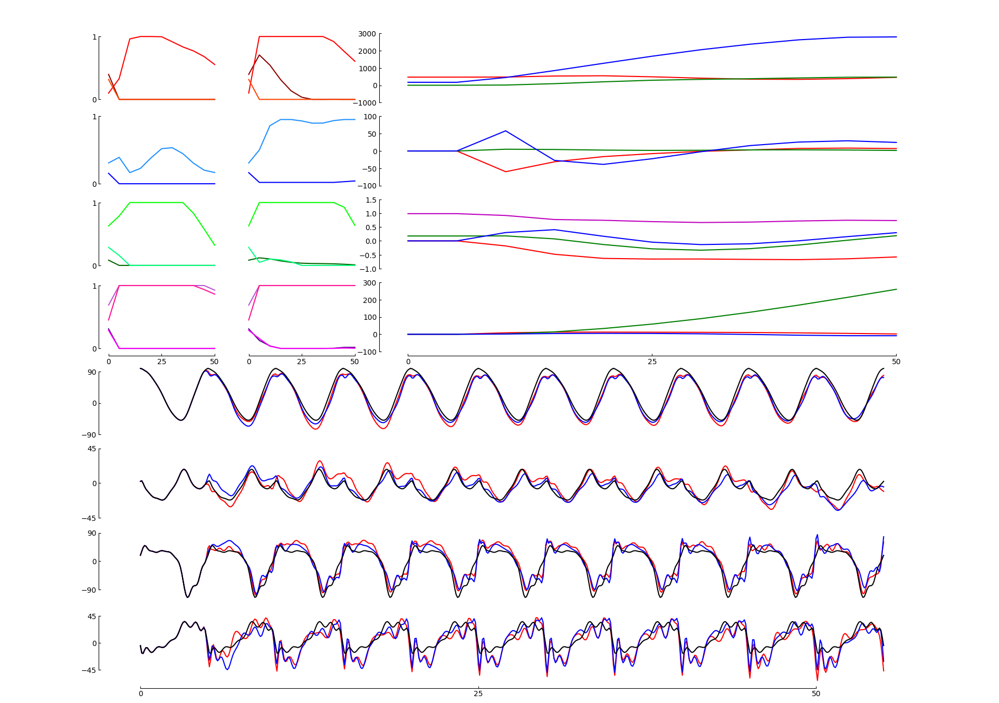

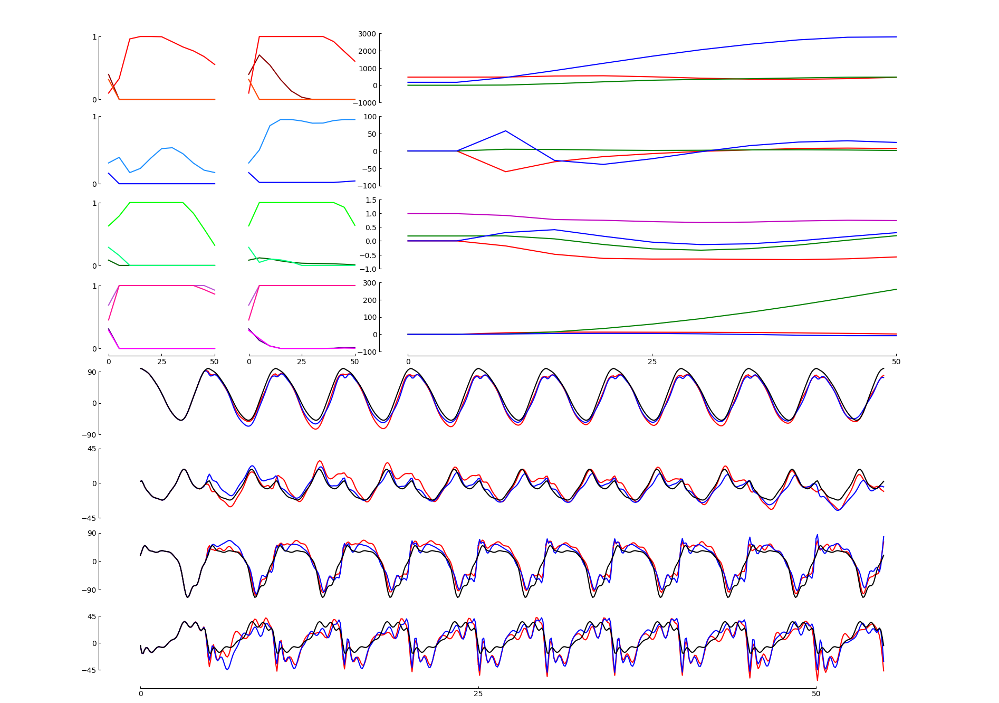

In [15]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi
xsi_goal = 90.0/180.0*np.pi

# goal velocity:
v_goal = 1000.0 # mm/s

# goal distance:
p_goal = 500.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(xsi_goal/2.0),      # q0
          0.0,                       # qx
          0.0,                       # qy
          np.sin(xsi_goal/2.0),      # qz
          0.0,                    # px [mm]
          p_goal,                    # py [mm]
          0.0]                       # pz [mm]

[1.0,0.0,1.0,0.0,0.0,0.0,np.cos(np.pi/4.0),0.0,0.0,np.sin(np.pi/4.0),10.0,10.0,0.0]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             0.01,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.001,  # px
             0.001,  # py
             0.001]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_forward
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_forward)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/loom_right'

# Plot oversight:
mpc.plot_oversight('loom_R',snapshot_dir)

mpc.make_video('loom_R',2,snapshot_dir,10)
mpc.make_video2('loom_R_stat',0,snapshot_dir,10)

#### Loom stimulus from the front

We simulate an escape maneuver from a loom stimulus coming from the front by starting in forward flight mode and specifying a point 500 mm backwards.

[[0.39784742]
 [0.09985816]
 [0.31684762]
 [0.30896843]
 [0.15565985]
 [0.08353185]
 [0.62860968]
 [0.28716471]
 [0.31046841]
 [0.28683996]
 [0.6881206 ]
 [0.45182334]]
This is Ipopt version 3.14.11, running with linear solver MUMPS 5.4.1.

Number of nonzeros in equality constraint Jacobian...:     4593
Number of nonzeros in inequality constraint Jacobian.:     3120
Number of nonzeros in Lagrangian Hessian.............:     6207

Total number of variables............................:      623
                     variables with only lower bounds:        0
                variables with lower and upper bounds:      597
                     variables with only upper bounds:        0
Total number of equality constraints.................:      143
Total number of inequality constraints...............:      240
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:

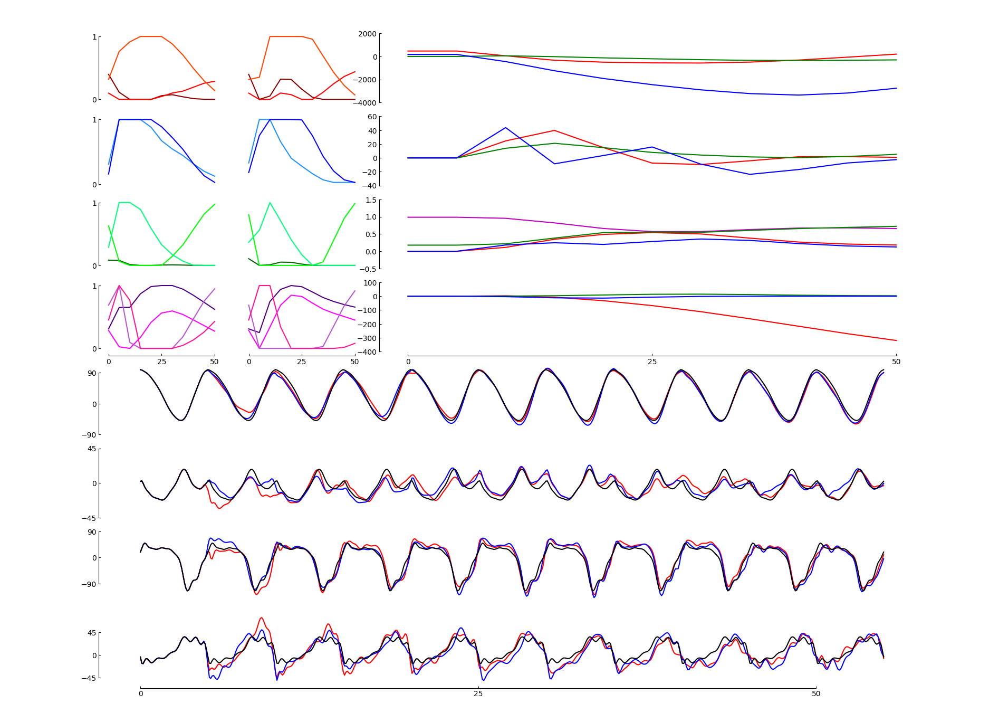

In [ ]:
# Specify control problem---------------------------------------------------------------------------------------------------

N_wbs  = 10 # number of wingbeats in which the fly should achieve the goal state

# goal pitch orientation (pitch down is positive, pitch up negative):
beta_goal = 20.0/180.0*np.pi
xsi_goal = 180.0/180.0*np.pi

# goal velocity:
v_goal = 1000.0 # mm/s

# goal distance:
p_goal = -500.0 # mm

# goal state
x_goal = [np.cos(beta_goal)*v_goal,  # vx [mm/s]
          0.0,                       # vy [mm/s]
          np.sin(beta_goal)*v_goal,  # vz [mm/s]
          0.0,                       # wx [rad/s]
          0.0,                       # wy [rad/s]
          0.0,                       # wz [rad/s]
          np.cos(xsi_goal/2.0),      # q0
          0.0,                       # qx
          0.0,                       # qy
          np.sin(xsi_goal/2.0),      # qz
          p_goal,                    # px [mm]
          0.0,                       # py [mm]
          0.0]                       # pz [mm]

[1.0,0.0,1.0,0.0,0.0,0.0,np.cos(np.pi/4.0),0.0,0.0,np.sin(np.pi/4.0),10.0,10.0,0.0]

# goal "importance" vector (0 is no importance, 1 is high importance):
x_scaling = [0.01,  # vx
             0.01,  # vy
             0.01,  # vz
             1.0,  # wx
             1.0,  # wy
             1.0,  # wz
             0.0,  # q0
             0.1,  # qx
             0.0,  # qy
             0.1,  # qz 
             0.001,  # px
             0.001,  # py
             0.1]  # pz

# set initial muscle activity pattern (left and right muscles are assumed to be symmetric):
# u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_base = uL_forward
print(u_base)

# cost of activation of muscles: u = [b1, b2, b3, iii1, iii2, iii3, hg1, hg2, hg3, hg4]
u_weights = [1.0,2.0,1.0,1.0,1.0,10.0,1.0,1.0,1.0,1.0,1.0,1.0]

mpc.set_N_wbs(N_wbs)
mpc.set_wingbeat_freq(wb_f)
mpc.set_initial_state(x_forward)
mpc.set_scaling(x_scaling)
mpc.set_goal(x_goal)
mpc.set_baseline_muscle_activity(u_base)
mpc.set_input_weights(u_weights)

# start controller, estimator and simulator:
mpc.setup_controller()
mpc.setup_estimator()
mpc.setup_simulator()

# run MPC controller:
mpc.run_mpc()

# Plot muscle activity:
mpc.plot_muscles()

# Plot wing motion:
mpc.plot_wing_motion()

# Plot body dynamics:
mpc.plot_body_dynamics()

# make video:
snapshot_dir = mpc.plots_dir+'/loom_front'

# Plot oversight:
mpc.plot_oversight('loom_F',snapshot_dir)

mpc.make_video('loom_F',2,snapshot_dir,10)
mpc.make_video2('loom_F_stat',0,snapshot_dir,10)